In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import pandas as pd
from warnings import filterwarnings
filterwarnings('ignore')
pd.set_option("display.max_columns",None)
pd.set_option("display.max_rows",None)

A = pd.read_csv("/content/drive/MyDrive/python/Attrition_Project/Trial 01/HR-Employee-Attrition-Table 1.csv")
A

In [ ]:

A.isna().sum()

Attrition                   0
Age                         0
BusinessTravel              0
DailyRate                   0
Department                  0
DistanceFromHome            0
Education                   0
EducationField              0
EmployeeCount               0
EmployeeNumber              0
EnvironmentSatisfaction     0
Gender                      0
HourlyRate                  0
JobInvolvement              0
JobLevel                    0
JobRole                     0
JobSatisfaction             0
MaritalStatus               0
MonthlyIncome               0
MonthlyRate                 0
NumCompaniesWorked          0
Over18                      0
OverTime                    0
PercentSalaryHike           0
PerformanceRating           0
RelationshipSatisfaction    0
StandardHours               0
StockOptionLevel            0
TotalWorkingYears           0
TrainingTimesLastYear       0
WorkLifeBalance             0
YearsAtCompany              0
YearsInCurrentRole          0
YearsSince

#### We can see data need not to replace any value but still Replacer and Preprocessing function we will create

# Replacer

In [4]:
def replacer(df):
    T=pd.DataFrame(df.isna().sum(), columns=['misval'])
    Q = T[T.misval > 0]
    for i in Q.index:
        if df[i].dtypes == "object":
            mode = df[i].mode()[0]
            df[i]=df[i].fillna(mode)
        else:
            mean = round(df[i].mean(), 2)
            df[i] = df[i].fillna(mean)


In [5]:
A['Department'].mode()[0]

'Research & Development'

In [6]:
A['Age'].mean()

36.923809523809524

In [7]:
replacer(A)

In [8]:
A

,Attrition,Age,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeNumber,EnvironmentSatisfaction,Gender,HourlyRate,JobInvolvement,JobLevel,JobRole,JobSatisfaction,MaritalStatus,MonthlyIncome,MonthlyRate,NumCompaniesWorked,Over18,OverTime,PercentSalaryHike,PerformanceRating,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,1,41,Travel_Rarely,1102,Sales,1,2,Life Sciences,1,1,2,Female,94,3,2,Sales Executive,4,Single,5993,19479,8,Y,Yes,11,3,1,80,0,8,0,1,6,4,0,5
1,0,49,Travel_Frequently,279,Research & Development,8,1,Life Sciences,1,2,3,Male,61,2,2,Research Scientist,2,Married,5130,24907,1,Y,No,23,4,4,80,1,10,3,3,10,7,1,7
2,1,37,Travel_Rarely,1373,Research & Development,2,2,Other,1,4,4,Male,92,2,1,Laboratory Technician,3,Single,2090,2396,6,Y,Yes,15,3,2,80,0,7,3,3,0,0,0,0
3,0,33,Travel_Frequently,1392,Research & Development,3,4,Life Sciences,1,5,4,Female,56,3,1,Research Scientist,3,Married,2909,23159,1,Y,Yes,11,3,3,80,0,8,3,3,8,7,3,0
4,0,27,Travel_Rarely,591,Research & Development,2,1,Medical,1,7,1,Male,40,3,1,Laboratory Technician,2,Married,3468,16632,9,Y,No,12,3,4,80,1,6,3,3,2,2,2,2
5,0,32,Travel_Frequently,1005,Research & Development,2,2,Life Sciences,1,8,4,Male,79,3,1,Laboratory Technician,4,Single,3068,11864,0,Y,No,13,3,3,80,0,8,2,2,7,7,3,6
6,0,59,Travel_Rarely,1324,Research & Development,3,3,Medical,1,10,3,Female,81,4,1,Laboratory Technician,1,Married,2670,9964,4,Y,Yes,20,4,1,80,3,12,3,2,1,0,0,0
7,0,30,Travel_Rarely,1358,Research & Development,24,1,Life Sciences,1,11,4,Male,67,3,1,Laboratory Technician,3,Divorced,2693,13335,1,Y,No,22,4,2,80,1,1,2,3,1,0,0,0
8,0,38,Travel_Frequently,216,Research & Development,23,3,Life Sciences,1,12,4,Male,44,2,3,Manufacturing Director,3,Single,9526,8787,0,Y,No,21,4,2,80,0,10,2,3,9,7,1,8
9,0,36,Travel_Rarely,1299,Research & Development,27,3,Medical,1,13,3,Male,94,3,2,Healthcare Representative,3,Married,5237,16577,6,Y,No,13,3,2,80,2,17,3,2,7,7,7,7


# Preprocessing

In [9]:
def preprocessing(X):
    import pandas as pd
    cat = []
    con = []
    for i in X.columns:
        if(X[i].dtypes =='object'):
            cat.append(i)
        else:
            con.append(i)

    X1 = pd.get_dummies(X[cat])
    from sklearn.preprocessing import StandardScaler
    ss = StandardScaler()
    X2 = pd.DataFrame(ss.fit_transform(X[con]),columns=con)

    X3 = X2.join(X1)
    return X3

In [10]:
for i in A.columns:
    print(i, len(A[i].unique()))

Attrition 2
Age 43
BusinessTravel 3
DailyRate 886
Department 3
DistanceFromHome 29
Education 5
EducationField 6
EmployeeCount 1
EmployeeNumber 1470
EnvironmentSatisfaction 4
Gender 2
HourlyRate 71
JobInvolvement 4
JobLevel 5
JobRole 9
JobSatisfaction 4
MaritalStatus 3
MonthlyIncome 1349
MonthlyRate 1427
NumCompaniesWorked 10
Over18 1
OverTime 2
PercentSalaryHike 15
PerformanceRating 2
RelationshipSatisfaction 4
StandardHours 1
StockOptionLevel 4
TotalWorkingYears 40
TrainingTimesLastYear 7
WorkLifeBalance 4
YearsAtCompany 37
YearsInCurrentRole 19
YearsSinceLastPromotion 16
YearsWithCurrManager 18


In [11]:
A.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1470 entries, 0 to 1469
Data columns (total 35 columns):
 #   Column                    Non-Null Count  Dtype 
---  ------                    --------------  ----- 
 0   Attrition                 1470 non-null   int64 
 1   Age                       1470 non-null   int64 
 2   BusinessTravel            1470 non-null   object
 3   DailyRate                 1470 non-null   int64 
 4   Department                1470 non-null   object
 5   DistanceFromHome          1470 non-null   int64 
 6   Education                 1470 non-null   int64 
 7   EducationField            1470 non-null   object
 8   EmployeeCount             1470 non-null   int64 
 9   EmployeeNumber            1470 non-null   int64 
 10  EnvironmentSatisfaction   1470 non-null   int64 
 11  Gender                    1470 non-null   object
 12  HourlyRate                1470 non-null   int64 
 13  JobInvolvement            1470 non-null   int64 
 14  JobLevel                

# Exploratory Data Analysis

# Univariate Analysis

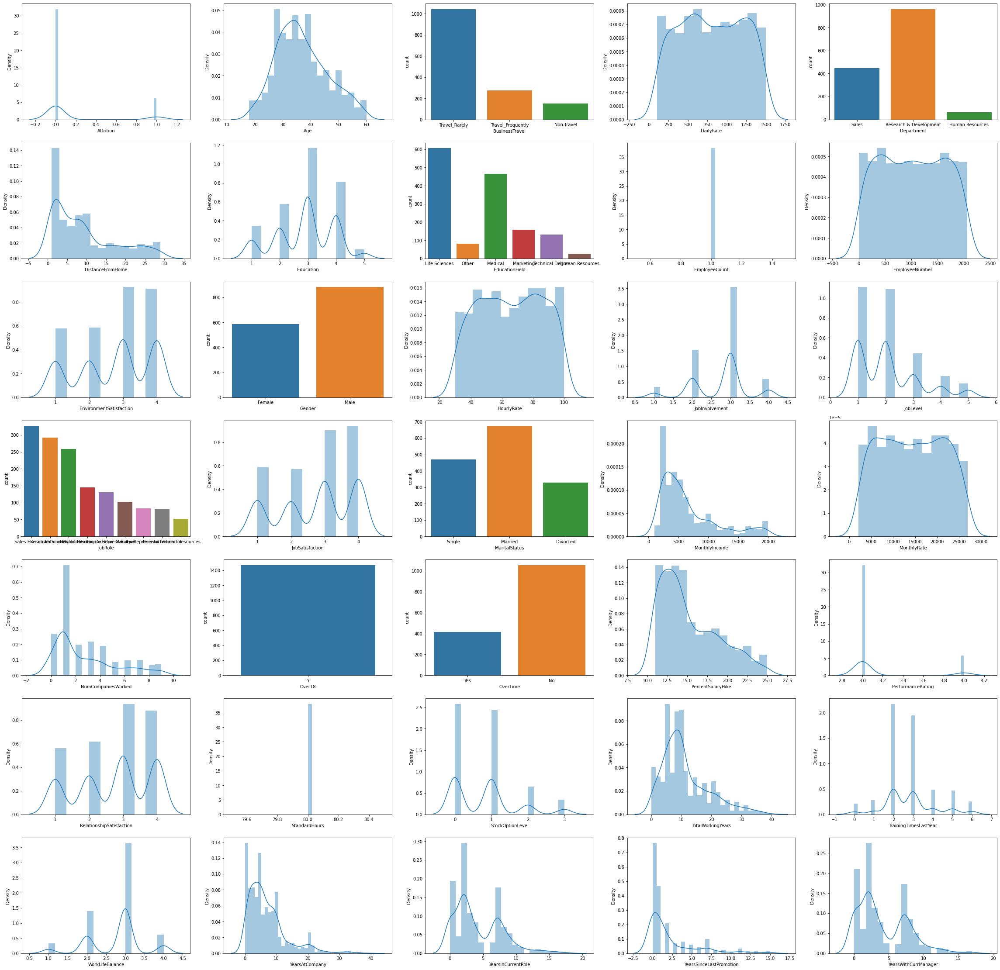

In [12]:
import seaborn as sns
import matplotlib.pyplot as plt
x = 1
plt.figure(figsize=(40,40))
for i in A.columns:
    if A[i].dtypes == 'object':
        plt.subplot(7,5,x)
        sns.countplot(A[i])
        x = x + 1
    else:
        plt.subplot(7,5,x)
        sns.distplot(A[i])
        x = x+1

## Pair PLot is little bit time consuming

In [13]:
#sns.pairplot(A)

# Define X and Y

In [14]:
A.columns

Index(['Attrition', 'Age', 'BusinessTravel', 'DailyRate', 'Department',
       'DistanceFromHome', 'Education', 'EducationField', 'EmployeeCount',
       'EmployeeNumber', 'EnvironmentSatisfaction', 'Gender', 'HourlyRate',
       'JobInvolvement', 'JobLevel', 'JobRole', 'JobSatisfaction',
       'MaritalStatus', 'MonthlyIncome', 'MonthlyRate', 'NumCompaniesWorked',
       'Over18', 'OverTime', 'PercentSalaryHike', 'PerformanceRating',
       'RelationshipSatisfaction', 'StandardHours', 'StockOptionLevel',
       'TotalWorkingYears', 'TrainingTimesLastYear', 'WorkLifeBalance',
       'YearsAtCompany', 'YearsInCurrentRole', 'YearsSinceLastPromotion',
       'YearsWithCurrManager'],
      dtype='object')

In [15]:
X = A.drop(['EmployeeNumber', "MonthlyRate",'Over18', 'StandardHours', 'EmployeeCount'], axis=1)
Y = A[["MonthlyRate"]]

# Bivariate Analysis

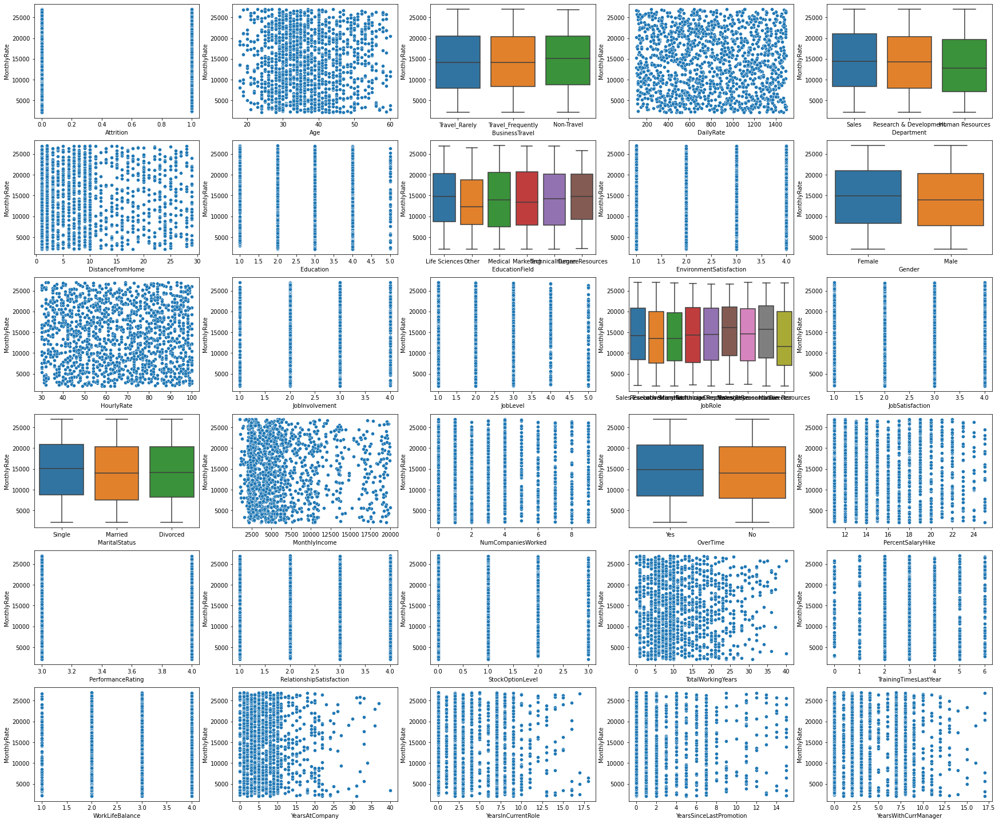

In [16]:
import seaborn as sns
import matplotlib.pyplot as plt
x = 1
plt.figure(figsize=(30,30))
for i in X.columns:
    if X[i].dtypes == 'object':
        plt.subplot(7,5,x)
        sns.boxplot(X[i],Y['MonthlyRate'])
        x = x + 1
    else:
        plt.subplot(7,5,x)
        sns.scatterplot(X[i], Y['MonthlyRate'])
        x=x+1

# Preprocessing

In [17]:
X = preprocessing(X)

In [18]:

X

,Attrition,Age,DailyRate,DistanceFromHome,Education,EnvironmentSatisfaction,HourlyRate,JobInvolvement,JobLevel,JobSatisfaction,MonthlyIncome,NumCompaniesWorked,PercentSalaryHike,PerformanceRating,RelationshipSatisfaction,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager,BusinessTravel_Non-Travel,BusinessTravel_Travel_Frequently,BusinessTravel_Travel_Rarely,Department_Human Resources,Department_Research & Development,Department_Sales,EducationField_Human Resources,EducationField_Life Sciences,EducationField_Marketing,EducationField_Medical,EducationField_Other,EducationField_Technical Degree,Gender_Female,Gender_Male,JobRole_Healthcare Representative,JobRole_Human Resources,JobRole_Laboratory Technician,JobRole_Manager,JobRole_Manufacturing Director,JobRole_Research Director,JobRole_Research Scientist,JobRole_Sales Executive,JobRole_Sales Representative,MaritalStatus_Divorced,MaritalStatus_Married,MaritalStatus_Single,OverTime_No,OverTime_Yes
0,2.280906,0.446350,0.742527,-1.010909,-0.891688,-0.660531,1.383138,0.379672,-0.057788,1.153254,-0.108350,2.125136,-1.150554,-0.426230,-1.584178,-0.932014,-0.421642,-2.171982,-2.493820,-0.164613,-0.063296,-0.679146,0.245834,0,0,1,0,0,1,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,1,0,1
1,-0.438422,1.322365,-1.297775,-0.147150,-1.868426,0.254625,-0.240677,-1.026167,-0.057788,-0.660853,-0.291719,-0.678049,2.129306,2.346151,1.191438,0.241988,-0.164511,0.155707,0.338096,0.488508,0.764998,-0.368715,0.806541,0,1,0,0,1,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,1,0,1,0
2,2.280906,0.008343,1.414363,-0.887515,-0.891688,1.169781,1.284725,-1.026167,-0.961486,0.246200,-0.937654,1.324226,-0.057267,-0.426230,-0.658973,-0.932014,-0.550208,0.155707,0.338096,-1.144294,-1.167687,-0.679146,-1.155935,0,0,1,0,1,0,0,0,0,0,1,0,0,1,0,0,1,0,0,0,0,0,0,0,0,1,0,1
3,-0.438422,-0.429664,1.461466,-0.764121,1.061787,1.169781,-0.486709,0.379672,-0.961486,0.246200,-0.763634,-0.678049,-1.150554,-0.426230,0.266233,-0.932014,-0.421642,0.155707,0.338096,0.161947,0.764998,0.252146,-1.155935,0,1,0,0,1,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,1,0,0,1
4,-0.438422,-1.086676,-0.524295,-0.887515,-1.868426,-1.575686,-1.274014,0.379672,-0.961486,-0.660853,-0.644858,2.525591,-0.877232,-0.426230,1.191438,0.241988,-0.678774,0.155707,0.338096,-0.817734,-0.615492,-0.058285,-0.595227,0,0,1,0,1,0,0,0,0,1,0,0,0,1,0,0,1,0,0,0,0,0,0,0,1,0,1,0
5,-0.438422,-0.539166,0.502054,-0.887515,-0.891688,1.169781,0.645041,0.379672,-0.961486,1.153254,-0.729850,-1.078504,-0.603911,-0.426230,0.266233,-0.932014,-0.421642,-0.620189,-1.077862,-0.001333,0.764998,0.252146,0.526188,0,1,0,0,1,0,0,1,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,1,1,0
6,-0.438422,2.417384,1.292887,-0.764121,0.085049,0.254625,0.743454,1.785511,-0.961486,-1.567907,-0.814416,0.523316,1.309341,2.346151,-1.584178,2.589994,0.092620,0.155707,-1.077862,-0.981014,-1.167687,-0.679146,-1.155935,0,0,1,0,1,0,0,0,0,1,0,0,1,0,0,0,1,0,0,0,0,0,0,0,1,0,0,1
7,-0.438422,-0.758170,1.377177,1.827158,-1.868426,1.169781,0.054562,0.379672,-0.961486,0.246200,-0.809529,-0.678049,1.855984,2.346151,-0.658973,0.241988,-1.321601,-0.620189,0.338096,-0.981014,-1.167687,-0.679146,-1.155935,0,0,1,0,1,0,0,1,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,1,0,0,1,0
8,-0.438422,0.117845,-1.453958,1.703764,0.085049,1.169781,-1.077188,-1.026167,0.845911,0.246200,0.642338,-1.078504,1.582663,2.346151,-0.658973,-0.932014,-0.164511,-0.620189,0.338096,0.325228,0.764998,-0.368715,1.086895,0,1,0,0,1,0,0,1,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,1,1,0
9,-0.438422,-0.101159,1.230910,2.197341,0.085049,0.254625,1.383138,0.379672,-0.057788,0.246200,-0.268983,1.324226,-0.603911,-0.426230,-0.658973,1.415991,0.735447,0.155707,-1.077862,-0.001333,0.764998,1.493867,0.806541,0,0,1,0,1,0,0,0,0,1,0,0,0,1,1,0,0,0,0,0,0,0,0,0,1,0,1,0


# **OLS**

In [19]:
X1 = X 
from sklearn.model_selection import train_test_split
xtrain, xtest,ytrain, ytest = train_test_split(X1, Y, test_size = 0.2, random_state=21)
from statsmodels.api import OLS, add_constant
xconst = add_constant(xtrain)
ols = OLS(ytrain, xconst)
model = ols.fit()
model.summary()


<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:            MonthlyRate   R-squared:                       0.033
Model:                            OLS   Adj. R-squared:                 -0.004
Method:                 Least Squares   F-statistic:                    0.8831
Date:                Fri, 04 Feb 2022   Prob (F-statistic):              0.689
Time:                        13:21:40   Log-Likelihood:                -12077.
No. Observations:                1176   AIC:                         2.424e+04
Df Residuals:                    1131   BIC:                         2.447e+04
Df Model:                          44                                         
Covariance Type:            nonrobust                                         
=====================================================================================================
                                        coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------
const                             -1.445e+16   1.59e+16     -0.909      0.363   -4.57e+16    1.67e+16
Attrition                            55.0975    240.753      0.229      0.819    -417.275     527.470
Age                                 298.7025    305.460      0.978      0.328    -300.629     898.034
DailyRate                          -183.6141    211.315     -0.869      0.385    -598.227     230.999
DistanceFromHome                    336.9829    211.419      1.594      0.111     -77.835     751.801
Education                          -263.1643    214.022     -1.230      0.219    -683.090     156.761
EnvironmentSatisfaction             486.1152    213.609      2.276      0.023      67.001     905.229
HourlyRate                          -22.4649    211.382     -0.106      0.915    -437.209     392.279
JobInvolvement                     -235.2686    213.422     -1.102      0.271    -654.016     183.479
JobLevel                            391.7885    772.086      0.507      0.612   -1123.094    1906.671
JobSatisfaction                     -34.7996    211.295     -0.165      0.869    -449.373     379.774
MonthlyIncome                      -960.6465    878.010     -1.094      0.274   -2683.357     762.065
NumCompaniesWorked                   63.6222    235.808      0.270      0.787    -399.048     526.292
PercentSalaryHike                   -20.4557    329.685     -0.062      0.951    -667.318     626.407
PerformanceRating                   -82.4763    338.469     -0.244      0.808    -746.575     581.622
RelationshipSatisfaction             13.4784    211.993      0.064      0.949    -402.465     429.422
StockOptionLevel                   -189.4367    284.230     -0.666      0.505    -747.113     368.240
TotalWorkingYears                    48.4106    478.635      0.101      0.919    -890.703     987.524
TrainingTimesLastYear                33.2005    215.341      0.154      0.877    -389.312     455.713
WorkLifeBalance                     153.3362    211.135      0.726      0.468    -260.924     567.596
YearsAtCompany                     -365.8887    456.528     -0.801      0.423   -1261.626     529.848
YearsInCurrentRole                  -44.6360    343.224     -0.130      0.897    -718.064     628.791
YearsSinceLastPromotion             163.4164    281.274      0.581      0.561    -388.461     715.294
YearsWithCurrManager               -308.5210    344.059     -0.897      0.370    -983.587     366.545
BusinessTravel_Non-Travel         -1.759e+16   1.94e+16     -0.909      0.363   -5.56e+16    2.04e+16
BusinessTravel_Travel_Frequently  -1.759e+16   1.94e+16     -0.909      0.363   -5.56e+16    2.04e+16
BusinessTravel_Travel_Rarely      -1.759e+16   1.94e+16     -0.909      0.363   -5.56e+16    2.04e+16
Department_Human Resour

In [20]:
model.pvalues.sort_values()

EnvironmentSatisfaction              0.023049
DistanceFromHome                     0.111236
Education                            0.219098
JobInvolvement                       0.270538
MonthlyIncome                        0.274136
Age                                  0.328344
Gender_Female                        0.363495
Gender_Male                          0.363495
JobRole_Research Scientist           0.363495
EducationField_Other                 0.363495
Department_Research & Development    0.363495
JobRole_Laboratory Technician        0.363495
JobRole_Healthcare Representative    0.363495
Department_Sales                     0.363495
OverTime_Yes                         0.363495
OverTime_No                          0.363495
JobRole_Human Resources              0.363495
JobRole_Manufacturing Director       0.363495
Department_Human Resources           0.363495
EducationField_Technical Degree      0.363495
BusinessTravel_Non-Travel            0.363495
EducationField_Medical            

In [21]:
from re import M
q = pd.DataFrame(model.pvalues, columns = ["Pvalues"])
m = []
for i in q.Pvalues:
  m.append(round(i,3))

q.Pvalues = m
drpd_clms = q[q.Pvalues > 0.9].index
drpd_clms

Index(['HourlyRate', 'PercentSalaryHike', 'RelationshipSatisfaction',
       'TotalWorkingYears'],
      dtype='object')

In [22]:
X1 = X1.drop(drpd_clms, axis = 1)
from sklearn.model_selection import train_test_split
xtrain, xtest,ytrain, ytest = train_test_split(X1, Y, test_size = 0.2, random_state=21)
from statsmodels.api import OLS, add_constant
xconst = add_constant(xtrain)
ols = OLS(ytrain, xconst)
model = ols.fit()
model.summary()


<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:            MonthlyRate   R-squared:                       0.033
Model:                            OLS   Adj. R-squared:                 -0.001
Method:                 Least Squares   F-statistic:                    0.9673
Date:                Fri, 04 Feb 2022   Prob (F-statistic):              0.530
Time:                        13:21:40   Log-Likelihood:                -12077.
No. Observations:                1176   AIC:                         2.424e+04
Df Residuals:                    1135   BIC:                         2.444e+04
Df Model:                          40                                         
Covariance Type:            nonrobust                                         
=====================================================================================================
                                        coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------
const                             -1.517e+16   1.55e+16     -0.976      0.329   -4.57e+16    1.53e+16
Attrition                            77.2780    240.521      0.321      0.748    -394.638     549.194
Age                                 340.7013    264.364      1.289      0.198    -177.996     859.399
DailyRate                          -201.2777    210.886     -0.954      0.340    -615.049     212.493
DistanceFromHome                    328.0889    210.519      1.558      0.119     -84.961     741.139
Education                          -280.4090    214.684     -1.306      0.192    -701.631     140.813
EnvironmentSatisfaction             500.2943    213.042      2.348      0.019      82.294     918.295
JobInvolvement                     -227.8098    212.324     -1.073      0.284    -644.400     188.781
JobLevel                            411.9789    756.104      0.545      0.586   -1071.539    1895.497
JobSatisfaction                     -29.2593    209.851     -0.139      0.889    -440.999     382.481
MonthlyIncome                      -941.1652    867.009     -1.086      0.278   -2642.285     759.954
NumCompaniesWorked                   61.4078    229.389      0.268      0.789    -388.666     511.481
PerformanceRating                  -109.6781    217.275     -0.505      0.614    -535.984     316.627
StockOptionLevel                   -175.8570    282.903     -0.622      0.534    -730.928     379.214
TrainingTimesLastYear                29.0086    214.816      0.135      0.893    -392.473     450.490
WorkLifeBalance                     153.0724    210.677      0.727      0.468    -260.287     566.432
YearsAtCompany                     -349.6042    436.995     -0.800      0.424   -1207.012     507.804
YearsInCurrentRole                  -48.4651    342.100     -0.142      0.887    -719.684     622.754
YearsSinceLastPromotion             163.2809    280.604      0.582      0.561    -387.280     713.842
YearsWithCurrManager               -302.8820    342.998     -0.883      0.377    -975.864     370.100
BusinessTravel_Non-Travel          3.085e+16   3.16e+16      0.976      0.329   -3.11e+16    9.28e+16
BusinessTravel_Travel_Frequently   3.085e+16   3.16e+16      0.976      0.329   -3.11e+16    9.28e+16
BusinessTravel_Travel_Rarely       3.085e+16   3.16e+16      0.976      0.329   -3.11e+16    9.28e+16
Department_Human Resources         1.822e+16   1.87e+16      0.976      0.329   -1.84e+16    5.48e+16
Department_Research & Development  1.822e+16   1.87e+16      0.976      0.329   -1.84e+16    5.48e+16
Department_Sales                   1.822e+16   1.87e+16      0.976      0.329   -1.84e+16    5.48e+16
EducationField_Human Resources    -6.424e+15   6.58e+15     -0.976      0.329   -1.93e+16    6.48e+15
EducationField_Life Sci

In [23]:

q = pd.DataFrame(model.pvalues, columns = ["Pvalues"])
m = []
for i in q.Pvalues:
  m.append(round(i,3))

q.Pvalues = m
drpd_clms = q[q.Pvalues > 0.8].index
drpd_clms


Index(['JobSatisfaction', 'TrainingTimesLastYear', 'YearsInCurrentRole'], dtype='object')

In [24]:

X1 = X1.drop(drpd_clms, axis = 1)
from sklearn.model_selection import train_test_split
xtrain, xtest,ytrain, ytest = train_test_split(X1, Y, test_size = 0.2, random_state=21)
from statsmodels.api import OLS, add_constant
xconst = add_constant(xtrain)
ols = OLS(ytrain, xconst)
model = ols.fit()
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:            MonthlyRate   R-squared:                       0.033
Model:                            OLS   Adj. R-squared:                  0.002
Method:                 Least Squares   F-statistic:                     1.053
Date:                Fri, 04 Feb 2022   Prob (F-statistic):              0.384
Time:                        13:21:40   Log-Likelihood:                -12077.
No. Observations:                1176   AIC:                         2.423e+04
Df Residuals:                    1138   BIC:                         2.442e+04
Df Model:                          37                                         
Covariance Type:            nonrobust                                         
=====================================================================================================
                                        coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------
const                             -8.974e+15   1.03e+16     -0.870      0.384   -2.92e+16    1.13e+16
Attrition                            55.3147    236.463      0.234      0.815    -408.638     519.268
Age                                 339.4669    263.853      1.287      0.199    -178.226     857.160
DailyRate                          -198.3942    210.124     -0.944      0.345    -610.668     213.879
DistanceFromHome                    324.1128    210.184      1.542      0.123     -88.279     736.504
Education                          -274.3332    214.029     -1.282      0.200    -694.268     145.602
EnvironmentSatisfaction             500.0974    212.675      2.351      0.019      82.818     917.376
JobInvolvement                     -227.9534    211.828     -1.076      0.282    -643.570     187.663
JobLevel                            406.3416    755.408      0.538      0.591   -1075.807    1888.490
MonthlyIncome                      -896.2061    869.313     -1.031      0.303   -2601.842     809.430
NumCompaniesWorked                   68.0163    228.578      0.298      0.766    -380.465     516.498
PerformanceRating                   -96.5287    215.409     -0.448      0.654    -519.172     326.115
StockOptionLevel                   -188.4535    281.846     -0.669      0.504    -741.449     364.542
WorkLifeBalance                     156.5437    209.514      0.747      0.455    -254.533     567.621
YearsAtCompany                     -357.4432    399.247     -0.895      0.371   -1140.786     425.900
YearsSinceLastPromotion             160.8543    278.336      0.578      0.563    -385.255     706.963
YearsWithCurrManager               -339.4894    330.231     -1.028      0.304    -987.420     308.441
BusinessTravel_Non-Travel          3.785e+16   4.35e+16      0.870      0.384   -4.75e+16    1.23e+17
BusinessTravel_Travel_Frequently   3.785e+16   4.35e+16      0.870      0.384   -4.75e+16    1.23e+17
BusinessTravel_Travel_Rarely       3.785e+16   4.35e+16      0.870      0.384   -4.75e+16    1.23e+17
Department_Human Resources         5.879e+15   6.76e+15      0.870      0.384   -7.38e+15    1.91e+16
Department_Research & Development  5.879e+15   6.76e+15      0.870      0.384   -7.38e+15    1.91e+16
Department_Sales                   5.879e+15   6.76e+15      0.870      0.384   -7.38e+15    1.91e+16
EducationField_Human Resources    -6.894e+15   7.92e+15     -0.870      0.384   -2.24e+16    8.65e+15
EducationField_Life Sciences      -6.894e+15   7.92e+15     -0.870      0.384   -2.24e+16    8.65e+15
EducationField_Marketing          -6.894e+15   7.92e+15     -0.870      0.384   -2.24e+16    8.65e+15
EducationField_Medical            -6.894e+15   7.92e+15     -0.870      0.384   -2.24e+16    8.65e+15
EducationField_Other   

In [25]:
from re import M
q = pd.DataFrame(model.pvalues, columns = ["Pvalues"])
m = []
for i in q.Pvalues:
  m.append(round(i,3))

q.Pvalues = m
drpd_clms = q[q.Pvalues > 0.7].index
drpd_clms


Index(['Attrition', 'NumCompaniesWorked'], dtype='object')

In [26]:


X1 = X1.drop(drpd_clms, axis = 1)
from sklearn.model_selection import train_test_split
xtrain, xtest,ytrain, ytest = train_test_split(X1, Y, test_size = 0.2, random_state=21)
from statsmodels.api import OLS, add_constant
xconst = add_constant(xtrain)
ols = OLS(ytrain, xconst)
model = ols.fit()
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:            MonthlyRate   R-squared:                       0.032
Model:                            OLS   Adj. R-squared:                  0.003
Method:                 Least Squares   F-statistic:                     1.089
Date:                Fri, 04 Feb 2022   Prob (F-statistic):              0.333
Time:                        13:21:40   Log-Likelihood:                -12077.
No. Observations:                1176   AIC:                         2.423e+04
Df Residuals:                    1140   BIC:                         2.441e+04
Df Model:                          35                                         
Covariance Type:            nonrobust                                         
=====================================================================================================
                                        coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------
const                             -3.264e+16   2.68e+16     -1.217      0.224   -8.52e+16       2e+16
Age                                 352.6210    254.561      1.385      0.166    -146.840     852.082
DailyRate                          -200.5853    209.525     -0.957      0.339    -611.683     210.513
DistanceFromHome                    333.9129    209.252      1.596      0.111     -76.649     744.475
Education                          -251.5467    212.235     -1.185      0.236    -667.963     164.869
EnvironmentSatisfaction             479.3843    210.233      2.280      0.023      66.898     891.871
JobInvolvement                     -233.9587    209.515     -1.117      0.264    -645.037     177.120
JobLevel                            409.6049    754.528      0.543      0.587   -1070.815    1890.025
MonthlyIncome                      -901.9764    865.201     -1.043      0.297   -2599.542     795.589
PerformanceRating                  -106.3710    215.392     -0.494      0.622    -528.980     316.238
StockOptionLevel                   -178.4928    281.507     -0.634      0.526    -730.823     373.837
WorkLifeBalance                     139.8863    209.367      0.668      0.504    -270.901     550.674
YearsAtCompany                     -388.7480    391.483     -0.993      0.321   -1156.856     379.360
YearsSinceLastPromotion             160.2822    276.259      0.580      0.562    -381.750     702.314
YearsWithCurrManager               -338.9006    328.951     -1.030      0.303    -984.319     306.517
BusinessTravel_Non-Travel          2.373e+16   1.95e+16      1.217      0.224   -1.45e+16     6.2e+16
BusinessTravel_Travel_Frequently   2.373e+16   1.95e+16      1.217      0.224   -1.45e+16     6.2e+16
BusinessTravel_Travel_Rarely       2.373e+16   1.95e+16      1.217      0.224   -1.45e+16     6.2e+16
Department_Human Resources          1.32e+16   1.08e+16      1.217      0.224   -8.08e+15    3.45e+16
Department_Research & Development   1.32e+16   1.08e+16      1.217      0.224   -8.08e+15    3.45e+16
Department_Sales                    1.32e+16   1.08e+16      1.217      0.224   -8.08e+15    3.45e+16
EducationField_Human Resources    -9.851e+15   8.09e+15     -1.217      0.224   -2.57e+16    6.03e+15
EducationField_Life Sciences      -9.851e+15   8.09e+15     -1.217      0.224   -2.57e+16    6.03e+15
EducationField_Marketing          -9.851e+15   8.09e+15     -1.217      0.224   -2.57e+16    6.03e+15
EducationField_Medical            -9.851e+15   8.09e+15     -1.217      0.224   -2.57e+16    6.03e+15
EducationField_Other              -9.851e+15   8.09e+15     -1.217      0.224   -2.57e+16    6.03e+15
EducationField_Technical Degree   -9.851e+15   8.09e+15     -1.217      0.224   -2.57e+16    6.03e+15
Gender_Female          

In [27]:
from re import M
q = pd.DataFrame(model.pvalues, columns = ["Pvalues"])
m = []
for i in q.Pvalues:
  m.append(round(i,3))

q.Pvalues = m
drpd_clms = q[q.Pvalues > 0.04].index
drpd_clms



Index(['const', 'Age', 'DailyRate', 'DistanceFromHome', 'Education',
       'JobInvolvement', 'JobLevel', 'MonthlyIncome', 'PerformanceRating',
       'StockOptionLevel', 'WorkLifeBalance', 'YearsAtCompany',
       'YearsSinceLastPromotion', 'YearsWithCurrManager',
       'BusinessTravel_Non-Travel', 'BusinessTravel_Travel_Frequently',
       'BusinessTravel_Travel_Rarely', 'Department_Human Resources',
       'Department_Research & Development', 'Department_Sales',
       'EducationField_Human Resources', 'EducationField_Life Sciences',
       'EducationField_Marketing', 'EducationField_Medical',
       'EducationField_Other', 'EducationField_Technical Degree',
       'Gender_Female', 'Gender_Male', 'JobRole_Healthcare Representative',
       'JobRole_Human Resources', 'JobRole_Laboratory Technician',
       'JobRole_Manager', 'JobRole_Manufacturing Director',
       'JobRole_Research Director', 'JobRole_Research Scientist',
       'JobRole_Sales Executive', 'JobRole_Sales Representat

In [28]:
from sklearn.model_selection import train_test_split
xtrain, xtest,ytrain, ytest = train_test_split(X1, Y, test_size = 0.2, random_state=21)

In [29]:
from sklearn.linear_model import LinearRegression
lr = LinearRegression()
modelr = lr.fit(xtrain,ytrain)
predtr = modelr.predict(xtrain)
predts = modelr.predict(xtest)
from sklearn.metrics import mean_absolute_error
print("train Error ====>", round(mean_absolute_error(predtr, ytrain),20))
print("test Error ====>", round(mean_absolute_error(predts, ytest),20))

train Error ====> 6019.876222363946
test Error ====> 6430.699723639455



# Anova Creation

In [30]:
cat = []
con = []
for i in A.columns:
    if A[i].dtypes =="object":
        cat.append(i)
    else:
        con.append(i)

In [31]:
con

['Attrition',
 'Age',
 'DailyRate',
 'DistanceFromHome',
 'Education',
 'EmployeeCount',
 'EmployeeNumber',
 'EnvironmentSatisfaction',
 'HourlyRate',
 'JobInvolvement',
 'JobLevel',
 'JobSatisfaction',
 'MonthlyIncome',
 'MonthlyRate',
 'NumCompaniesWorked',
 'PercentSalaryHike',
 'PerformanceRating',
 'RelationshipSatisfaction',
 'StandardHours',
 'StockOptionLevel',
 'TotalWorkingYears',
 'TrainingTimesLastYear',
 'WorkLifeBalance',
 'YearsAtCompany',
 'YearsInCurrentRole',
 'YearsSinceLastPromotion',
 'YearsWithCurrManager']

In [32]:
cat

['BusinessTravel',
 'Department',
 'EducationField',
 'Gender',
 'JobRole',
 'MaritalStatus',
 'Over18',
 'OverTime']

# Anova Of Predictors

In [33]:
from statsmodels.api import OLS
from statsmodels.formula.api import ols
model = ols("EmployeeCount ~  MaritalStatus" , A).fit()
from statsmodels.stats.anova import anova_lm
anova_result = anova_lm(model)
Df = pd.DataFrame(anova_result)
Df

,df,sum_sq,mean_sq,F,PR(>F)
MaritalStatus,2.0,1.240117e-28,6.200583e-29,2.94557,0.052883
Residual,1467.0,3.088114e-26,2.105054e-29,NaN,NaN


In [34]:
from statsmodels.api import OLS
from statsmodels.formula.api import ols
model = ols("EmployeeCount ~  MaritalStatus" , A).fit()
from statsmodels.stats.anova import anova_lm
anova_result = anova_lm(model)
Df = pd.DataFrame(anova_result)
q = Df['PR(>F)'][0]
q

0.05288312282841075

In [35]:
from statsmodels.api import OLS
from statsmodels.formula.api import ols
model = ols("EmployeeCount ~  MaritalStatus" , A).fit()
from statsmodels.stats.anova import anova_lm
anova_result = anova_lm(model)
Df = pd.DataFrame(anova_result)
q = Df['PR(>F)']["MaritalStatus"]
round(q,4)

0.0529

In [36]:
def anova(df, cat, con):
    from statsmodels.formula.api import ols
    from statsmodels.stats.anova import anova_lm
    rel = con + "~" + cat
    model = ols(rel,df).fit()
    anova_result = anova_lm(model)
    Df = pd.DataFrame(anova_result)
    q = Df['PR(>F)'][cat]
    q = round(q,4)
    return q

In [37]:
anova(A,'MaritalStatus' ,'EmployeeCount')

0.0529

In [38]:
d = pd.DataFrame([cat,con]).T
d.columns = ["Cate", "Cont"]
d

,Cate,Cont
0,BusinessTravel,Attrition
1,Department,Age
2,EducationField,DailyRate
3,Gender,DistanceFromHome
4,JobRole,Education
5,MaritalStatus,EmployeeCount
6,Over18,EmployeeNumber
7,OverTime,EnvironmentSatisfaction
8,None,HourlyRate
9,None,JobInvolvement


In [39]:
v= list(d["Cont"])
v[0]

'Attrition'

In [40]:
a = anova(A,'BusinessTravel','Attrition' )
print('BusinessTravel ~ Attrition:',a)
a = anova(A,'BusinessTravel','Age' )
print('BusinessTravel ~ Age:',a)
a = anova(A,'BusinessTravel','DailyRate' )
print('BusinessTravel ~ DailyRate:',a)
a = anova(A,'BusinessTravel','Attrition' )
print('BusinessTravel ~ Attrition:',a)
a = anova(A,'BusinessTravel','Attrition' )
print('BusinessTravel ~ Attrition:',a)
a = anova(A,'BusinessTravel','Attrition' )
print('BusinessTravel ~ Attrition:',a)
a = anova(A,'BusinessTravel','Attrition' )
print('BusinessTravel ~ Attrition:',a)
a = anova(A,'BusinessTravel','Attrition' )
print('BusinessTravel ~ Attrition:',a)
a = anova(A,'BusinessTravel','Attrition' )
print('BusinessTravel ~ Attrition:',a)
a = anova(A,'BusinessTravel','Attrition' )
print('BusinessTravel ~ Attrition:',a)

BusinessTravel ~ Attrition: 0.0
BusinessTravel ~ Age: 0.5357
BusinessTravel ~ DailyRate: 0.8354
BusinessTravel ~ Attrition: 0.0
BusinessTravel ~ Attrition: 0.0
BusinessTravel ~ Attrition: 0.0
BusinessTravel ~ Attrition: 0.0
BusinessTravel ~ Attrition: 0.0
BusinessTravel ~ Attrition: 0.0
BusinessTravel ~ Attrition: 0.0


# Anova Of Predictors For Cat vs Con

In [41]:
print("Anova Testing\n")
for i in range(0,26):
    v= list(d["Cont"])
    for j in range(0,6):
        c = list(d["Cate"])
        a = anova(A,c[j],v[i] )
        print(c[j], '~', v[i],a)
    print("================================")

Anova Testing

BusinessTravel ~ Attrition 0.0
Department ~ Attrition 0.0045
EducationField ~ Attrition 0.0067
Gender ~ Attrition 0.2591
JobRole ~ Attrition 0.0
MaritalStatus ~ Attrition 0.0
BusinessTravel ~ Age 0.5357
Department ~ Age 0.4653
EducationField ~ Age 0.3473
Gender ~ Age 0.1641
JobRole ~ Age 0.0
MaritalStatus ~ Age 0.0
BusinessTravel ~ DailyRate 0.8354
Department ~ DailyRate 0.5686
EducationField ~ DailyRate 0.0594
Gender ~ DailyRate 0.6535
JobRole ~ DailyRate 0.9238
MaritalStatus ~ DailyRate 0.0135
BusinessTravel ~ DistanceFromHome 0.6258
Department ~ DistanceFromHome 0.7906
EducationField ~ DistanceFromHome 0.6829
Gender ~ DistanceFromHome 0.9435
JobRole ~ DistanceFromHome 0.6181
MaritalStatus ~ DistanceFromHome 0.4693
BusinessTravel ~ Education 0.9436
Department ~ Education 0.7535
EducationField ~ Education 0.006
Gender ~ Education 0.5261
JobRole ~ Education 0.0014
MaritalStatus ~ Education 0.9866
BusinessTravel ~ EmployeeCount 0.0869
Department ~ EmployeeCount 0.0
Educat

In [42]:
print("Anova Testing\n")
for i in range(0,26):
    v= list(d["Cont"])
    
    a = anova(A,'BusinessTravel',v[i] )
    print('BusinessTravel', '~', v[i],a)
    print("================================")

Anova Testing

BusinessTravel ~ Attrition 0.0
BusinessTravel ~ Age 0.5357
BusinessTravel ~ DailyRate 0.8354
BusinessTravel ~ DistanceFromHome 0.6258
BusinessTravel ~ Education 0.9436
BusinessTravel ~ EmployeeCount 0.0869
BusinessTravel ~ EmployeeNumber 0.685
BusinessTravel ~ EnvironmentSatisfaction 0.8881
BusinessTravel ~ HourlyRate 0.5696
BusinessTravel ~ JobInvolvement 0.2132
BusinessTravel ~ JobLevel 0.6513
BusinessTravel ~ JobSatisfaction 0.3748
BusinessTravel ~ MonthlyIncome 0.3282
BusinessTravel ~ MonthlyRate 0.8376
BusinessTravel ~ NumCompaniesWorked 0.3108
BusinessTravel ~ PercentSalaryHike 0.3741
BusinessTravel ~ PerformanceRating 0.5882
BusinessTravel ~ RelationshipSatisfaction 0.334
BusinessTravel ~ StandardHours 0.8197
BusinessTravel ~ StockOptionLevel 0.4926
BusinessTravel ~ TotalWorkingYears 0.4201
BusinessTravel ~ TrainingTimesLastYear 0.7249
BusinessTravel ~ WorkLifeBalance 0.8887
BusinessTravel ~ YearsAtCompany 0.8227
BusinessTravel ~ YearsInCurrentRole 0.8982
Business

# Anova Of Predictors For Cat vs Con

In [43]:
print("Anova Testing\n")
for i in range(0,26):
    v= list(d["Cont"])
    
    a = anova(A,'Department',v[i] )
    print('Department', '~', v[i],a)
    print("================================")

Anova Testing

Department ~ Attrition 0.0045
Department ~ Age 0.4653
Department ~ DailyRate 0.5686
Department ~ DistanceFromHome 0.7906
Department ~ Education 0.7535
Department ~ EmployeeCount 0.0
Department ~ EmployeeNumber 0.0333
Department ~ EnvironmentSatisfaction 0.563
Department ~ HourlyRate 0.701
Department ~ JobInvolvement 0.6059
Department ~ JobLevel 0.0001
Department ~ JobSatisfaction 0.6053
Department ~ MonthlyIncome 0.041
Department ~ MonthlyRate 0.5697
Department ~ NumCompaniesWorked 0.3863
Department ~ PercentSalaryHike 0.397
Department ~ PerformanceRating 0.4522
Department ~ RelationshipSatisfaction 0.4059
Department ~ StandardHours 0.0
Department ~ StockOptionLevel 0.8099
Department ~ TotalWorkingYears 0.8332
Department ~ TrainingTimesLastYear 0.2348
Department ~ WorkLifeBalance 0.015
Department ~ YearsAtCompany 0.4669
Department ~ YearsInCurrentRole 0.0848
Department ~ YearsSinceLastPromotion 0.2946


In [44]:
list(d['Cate'])

['BusinessTravel',
 'Department',
 'EducationField',
 'Gender',
 'JobRole',
 'MaritalStatus',
 'Over18',
 'OverTime',
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None]

# Anova Of Predictors For Cat vs Con

In [45]:
print("Anova Testing\n")
for i in range(0,26):
    v= list(d["Cont"])
    
    a = anova(A,'Department',v[i] )
    print('Department', '~', v[i],a)
    print("================================")

Anova Testing

Department ~ Attrition 0.0045
Department ~ Age 0.4653
Department ~ DailyRate 0.5686
Department ~ DistanceFromHome 0.7906
Department ~ Education 0.7535
Department ~ EmployeeCount 0.0
Department ~ EmployeeNumber 0.0333
Department ~ EnvironmentSatisfaction 0.563
Department ~ HourlyRate 0.701
Department ~ JobInvolvement 0.6059
Department ~ JobLevel 0.0001
Department ~ JobSatisfaction 0.6053
Department ~ MonthlyIncome 0.041
Department ~ MonthlyRate 0.5697
Department ~ NumCompaniesWorked 0.3863
Department ~ PercentSalaryHike 0.397
Department ~ PerformanceRating 0.4522
Department ~ RelationshipSatisfaction 0.4059
Department ~ StandardHours 0.0
Department ~ StockOptionLevel 0.8099
Department ~ TotalWorkingYears 0.8332
Department ~ TrainingTimesLastYear 0.2348
Department ~ WorkLifeBalance 0.015
Department ~ YearsAtCompany 0.4669
Department ~ YearsInCurrentRole 0.0848
Department ~ YearsSinceLastPromotion 0.2946


# Anova Of Predictors For Cat vs Con

In [46]:
print("Anova Testing\n")
for i in range(0,26):
    v= list(d["Cont"])
    
    a = anova(A,'EducationField',v[i] )
    print('EducationField', '~', v[i],a)
    print("================================")

Anova Testing

EducationField ~ Attrition 0.0067
EducationField ~ Age 0.3473
EducationField ~ DailyRate 0.0594
EducationField ~ DistanceFromHome 0.6829
EducationField ~ Education 0.006
EducationField ~ EmployeeCount 0.0
EducationField ~ EmployeeNumber 0.7993
EducationField ~ EnvironmentSatisfaction 0.164
EducationField ~ HourlyRate 0.3052
EducationField ~ JobInvolvement 0.9636
EducationField ~ JobLevel 0.0065
EducationField ~ JobSatisfaction 0.4438
EducationField ~ MonthlyIncome 0.08
EducationField ~ MonthlyRate 0.7529
EducationField ~ NumCompaniesWorked 0.7041
EducationField ~ PercentSalaryHike 0.3831
EducationField ~ PerformanceRating 0.8374
EducationField ~ RelationshipSatisfaction 0.4794
EducationField ~ StandardHours 0.0
EducationField ~ StockOptionLevel 0.3059
EducationField ~ TotalWorkingYears 0.4137
EducationField ~ TrainingTimesLastYear 0.0854
EducationField ~ WorkLifeBalance 0.5667
EducationField ~ YearsAtCompany 0.6489
EducationField ~ YearsInCurrentRole 0.6575
EducationFiel

# Anova Of Predictors For Cat vs Con

In [47]:
print("Anova Testing\n")
for i in range(0,26):
    v= list(d["Cont"])
    
    a = anova(A,'Gender',v[i] )
    print('Gender', '~', v[i],a)
    print("================================")

Anova Testing

Gender ~ Attrition 0.2591
Gender ~ Age 0.1641
Gender ~ DailyRate 0.6535
Gender ~ DistanceFromHome 0.9435
Gender ~ Education 0.5261
Gender ~ EmployeeCount 0.0
Gender ~ EmployeeNumber 0.3875
Gender ~ EnvironmentSatisfaction 0.9845
Gender ~ HourlyRate 0.9854
Gender ~ JobInvolvement 0.4914
Gender ~ JobLevel 0.131
Gender ~ JobSatisfaction 0.2026
Gender ~ MonthlyIncome 0.2222
Gender ~ MonthlyRate 0.1119
Gender ~ NumCompaniesWorked 0.1336
Gender ~ PercentSalaryHike 0.9166
Gender ~ PerformanceRating 0.5955
Gender ~ RelationshipSatisfaction 0.3809
Gender ~ StandardHours 0.0006
Gender ~ StockOptionLevel 0.6262
Gender ~ TotalWorkingYears 0.0724
Gender ~ TrainingTimesLastYear 0.1372
Gender ~ WorkLifeBalance 0.916
Gender ~ YearsAtCompany 0.2544
Gender ~ YearsInCurrentRole 0.1119
Gender ~ YearsSinceLastPromotion 0.3012


# Anova Of Predictors For Cat vs Con

In [48]:
print("Anova Testing\n")
for i in range(0,26):
    v= list(d["Cont"])
    
    a = anova(A,'JobRole',v[i] )
    print('JobRole', '~', v[i],a)
    print("================================")

Anova Testing

JobRole ~ Attrition 0.0
JobRole ~ Age 0.0
JobRole ~ DailyRate 0.9238
JobRole ~ DistanceFromHome 0.6181
JobRole ~ Education 0.0014
JobRole ~ EmployeeCount 0.0
JobRole ~ EmployeeNumber 0.1985
JobRole ~ EnvironmentSatisfaction 0.2838
JobRole ~ HourlyRate 0.8967
JobRole ~ JobInvolvement 0.6629
JobRole ~ JobLevel 0.0
JobRole ~ JobSatisfaction 0.939
JobRole ~ MonthlyIncome 0.0
JobRole ~ MonthlyRate 0.779
JobRole ~ NumCompaniesWorked 0.0
JobRole ~ PercentSalaryHike 0.3578
JobRole ~ PerformanceRating 0.5268
JobRole ~ RelationshipSatisfaction 0.7806
JobRole ~ StandardHours 0.0
JobRole ~ StockOptionLevel 0.7559
JobRole ~ TotalWorkingYears 0.0
JobRole ~ TrainingTimesLastYear 0.1736
JobRole ~ WorkLifeBalance 0.0729
JobRole ~ YearsAtCompany 0.0
JobRole ~ YearsInCurrentRole 0.0
JobRole ~ YearsSinceLastPromotion 0.0


# Anova Of Predictors For Cat vs Con

In [49]:
print("Anova Testing\n")
for i in range(0,26):
    v= list(d["Cont"])
    
    a = anova(A,'MaritalStatus',v[i] )
    print('MaritalStatus', '~', v[i],a)
    print("================================")

Anova Testing

MaritalStatus ~ Attrition 0.0
MaritalStatus ~ Age 0.0
MaritalStatus ~ DailyRate 0.0135
MaritalStatus ~ DistanceFromHome 0.4693
MaritalStatus ~ Education 0.9866
MaritalStatus ~ EmployeeCount 0.0529
MaritalStatus ~ EmployeeNumber 0.1178
MaritalStatus ~ EnvironmentSatisfaction 0.6766
MaritalStatus ~ HourlyRate 0.3302
MaritalStatus ~ JobInvolvement 0.2223
MaritalStatus ~ JobLevel 0.0037
MaritalStatus ~ JobSatisfaction 0.6216
MaritalStatus ~ MonthlyIncome 0.0028
MaritalStatus ~ MonthlyRate 0.3097
MaritalStatus ~ NumCompaniesWorked 0.2899
MaritalStatus ~ PercentSalaryHike 0.6132
MaritalStatus ~ PerformanceRating 0.9069
MaritalStatus ~ RelationshipSatisfaction 0.2012
MaritalStatus ~ StandardHours 0.0
MaritalStatus ~ StockOptionLevel 0.0
MaritalStatus ~ TotalWorkingYears 0.0027
MaritalStatus ~ TrainingTimesLastYear 0.5068
MaritalStatus ~ WorkLifeBalance 0.84
MaritalStatus ~ YearsAtCompany 0.0247
MaritalStatus ~ YearsInCurrentRole 0.0035
MaritalStatus ~ YearsSinceLastPromotion 0.

# Anova Of Predictors For Cat vs Con

In [50]:
print("Anova Testing\n")
for i in range(0,26):
    v= list(d["Cont"])
    
    a = anova(A,'Over18',v[i] )
    print('Over18', '~', v[i],a)
    print("================================")

Anova Testing

Over18 ~ Attrition nan
Over18 ~ Age nan
Over18 ~ DailyRate nan
Over18 ~ DistanceFromHome nan
Over18 ~ Education nan
Over18 ~ EmployeeCount nan
Over18 ~ EmployeeNumber nan
Over18 ~ EnvironmentSatisfaction nan
Over18 ~ HourlyRate nan
Over18 ~ JobInvolvement nan
Over18 ~ JobLevel nan
Over18 ~ JobSatisfaction nan
Over18 ~ MonthlyIncome nan
Over18 ~ MonthlyRate nan
Over18 ~ NumCompaniesWorked nan
Over18 ~ PercentSalaryHike nan
Over18 ~ PerformanceRating nan
Over18 ~ RelationshipSatisfaction nan
Over18 ~ StandardHours nan
Over18 ~ StockOptionLevel nan
Over18 ~ TotalWorkingYears nan
Over18 ~ TrainingTimesLastYear nan
Over18 ~ WorkLifeBalance nan
Over18 ~ YearsAtCompany nan
Over18 ~ YearsInCurrentRole nan
Over18 ~ YearsSinceLastPromotion nan


# Anova Of Predictors For Cat vs Con

In [51]:
print("Anova Testing\n")
for i in range(0,26):
    v= list(d["Cont"])
    
    a = anova(A,'OverTime',v[i] )
    print('OverTime', '~', v[i],a)
    print("================================")

Anova Testing

OverTime ~ Attrition 0.0
OverTime ~ Age 0.2823
OverTime ~ DailyRate 0.7264
OverTime ~ DistanceFromHome 0.3283
OverTime ~ Education 0.4362
OverTime ~ EmployeeCount 0.7364
OverTime ~ EmployeeNumber 0.3571
OverTime ~ EnvironmentSatisfaction 0.0071
OverTime ~ HourlyRate 0.7656
OverTime ~ JobInvolvement 0.8931
OverTime ~ JobLevel 0.9834
OverTime ~ JobSatisfaction 0.3471
OverTime ~ MonthlyIncome 0.8156
OverTime ~ MonthlyRate 0.4116
OverTime ~ NumCompaniesWorked 0.4258
OverTime ~ PercentSalaryHike 0.8351
OverTime ~ PerformanceRating 0.8671
OverTime ~ RelationshipSatisfaction 0.0631
OverTime ~ StandardHours 0.0
OverTime ~ StockOptionLevel 0.9863
OverTime ~ TotalWorkingYears 0.6251
OverTime ~ TrainingTimesLastYear 0.0024
OverTime ~ WorkLifeBalance 0.2993
OverTime ~ YearsAtCompany 0.6544
OverTime ~ YearsInCurrentRole 0.2542
OverTime ~ YearsSinceLastPromotion 0.6392


# Divide Data into training and testing set

In [52]:
from sklearn.model_selection import train_test_split
xtrain,xtest,ytrain,ytest = train_test_split(X,Y,test_size=0.2, random_state=40)

# Linear Regresssion

In [53]:
from sklearn.linear_model import LinearRegression
lr = LinearRegression()
modelr = lr.fit(xtrain,ytrain)
predtr = modelr.predict(xtrain)
predts = modelr.predict(xtest)
from sklearn.metrics import mean_absolute_error
print("train Error ====>", round(mean_absolute_error(predtr, ytrain),20))
print("test Error ====>", round(mean_absolute_error(predts, ytest),20))

train Error ====> 6085.18112244898
test Error ====> 6192.034013605442


# Lasso 

In [54]:
tuning_grid = []
x = 0.1
for i in range(0,100):
    x = x + 0.001
    x = round(x,3)
    tuning_grid.append(x)
    
tp = {"alpha":tuning_grid}

In [55]:
from sklearn.linear_model import LinearRegression, Lasso, Ridge
l1 = Lasso()
from sklearn.model_selection import GridSearchCV
cv = GridSearchCV(l1,tp, scoring="neg_mean_absolute_error", cv = 5)
cvmodel = cv.fit(xtrain,ytrain)
bestval =cvmodel.best_params_
bestval

{'alpha': 0.2}

In [56]:
bestval['alpha']

0.2

In [57]:
from sklearn.linear_model import LinearRegression
l1 = Lasso(alpha=1.1)
modelr = l1.fit(xtrain,ytrain)
predtr = modelr.predict(xtrain)
predts = modelr.predict(xtest)
from sklearn.metrics import mean_absolute_error
print("train Error ====>", round(mean_absolute_error(predtr, ytrain),20))
print("test Error ====>", round(mean_absolute_error(predts, ytest),20))

train Error ====> 6086.951500456323
test Error ====> 6190.808984256642


# Ridge

In [58]:
tuning_grid = []
x = 0.1
for i in range(0,100):
    x = x + 0.001
    x = round(x,3)
    tuning_grid.append(x)
    
tp = {"alpha":tuning_grid}

In [59]:
from sklearn.linear_model import LinearRegression, Lasso, Ridge
l2 = Ridge()
from sklearn.model_selection import GridSearchCV
cv = GridSearchCV(l2,tp, scoring="neg_mean_absolute_error", cv = 5)
cvmodel = cv.fit(xtrain,ytrain)
bestval =cvmodel.best_params_
bestval

{'alpha': 0.2}

In [60]:
bestval['alpha']

0.2

In [61]:
from sklearn.linear_model import LinearRegression
l2 = Ridge(alpha=0.2)
modelr = l2.fit(xtrain,ytrain)
predtr = modelr.predict(xtrain)
predts = modelr.predict(xtest)
from sklearn.metrics import mean_absolute_error
print("train Error ====>", round(mean_absolute_error(predtr, ytrain),20))
print("test Error ====>", round(mean_absolute_error(predts, ytest),20))

train Error ====> 6085.490591922476
test Error ====> 6192.036507274708


# Decision Tree Regressor

In [62]:
from sklearn.tree import DecisionTreeRegressor
dtr = DecisionTreeRegressor()
tp = {"max_depth":range(10), "random_state": range(40)}
from sklearn.model_selection import GridSearchCV
cv = GridSearchCV(dtr,tp, scoring="neg_mean_absolute_error", cv = 5)
cvmodel = cv.fit(xtrain,ytrain)
bestval =cvmodel.best_params_
bestval

{'max_depth': 1, 'random_state': 0}

In [63]:
print("bestval['max_depth']: ",bestval['max_depth'])
print("bestval['random_state']: ",bestval['random_state'])

bestval['max_depth']:  1
bestval['random_state']:  0


In [64]:
from sklearn.tree import DecisionTreeRegressor
dtr = DecisionTreeRegressor(random_state=bestval['random_state'], max_depth=bestval['max_depth'])
modelr = dtr.fit(xtrain,ytrain)
predtr = modelr.predict(xtrain)
predts = modelr.predict(xtest)
from sklearn.metrics import mean_absolute_error
print("train Error ====>", round(mean_absolute_error(predtr, ytrain),20))
print("test Error ====>", round(mean_absolute_error(predts, ytest),20))

train Error ====> 6183.431233742428
test Error ====> 6089.34256559767


# Random Forest Regressor

In [65]:
from sklearn.ensemble import RandomForestRegressor 
rfr = RandomForestRegressor()
tp = {"n_estimators": range(30)}
from sklearn.model_selection import GridSearchCV
cv = GridSearchCV(rfr,tp, scoring="neg_mean_absolute_error", cv = 5)
cvmodel = cv.fit(xtrain,ytrain)
bestval =cvmodel.best_params_
bestval

{'n_estimators': 21}

In [66]:
rfr = RandomForestRegressor(random_state=1,n_estimators=bestval['n_estimators'])
modelr = rfr.fit(xtrain,ytrain)
predtr = modelr.predict(xtrain)
predts = modelr.predict(xtest)
from sklearn.metrics import mean_absolute_error
print("train Error ====>", round(mean_absolute_error(predtr, ytrain),20))
print("test Error ====>", round(mean_absolute_error(predts, ytest),20))

train Error ====> 2483.517614188532
test Error ====> 6113.909297052155



# Adaboost Regressor

In [67]:
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import AdaBoostRegressor
dtr = DecisionTreeRegressor(random_state=20,max_depth=2)
abr = AdaBoostRegressor(dtr)
tp = {"n_estimators": range(40)}
from sklearn.model_selection import GridSearchCV
cv = GridSearchCV(abr,tp, scoring="neg_mean_absolute_error", cv = 5)
cvmodel = cv.fit(xtrain,ytrain)
bestval =cvmodel.best_params_
bestval

{'n_estimators': 19}

In [68]:
from sklearn.tree import DecisionTreeRegressor
dtr = DecisionTreeRegressor(random_state= 21, max_depth=2)
abr = AdaBoostRegressor(random_state=20, n_estimators=bestval['n_estimators'])
modelr = abr.fit(xtrain,ytrain)
predtr = modelr.predict(xtrain)
predts = modelr.predict(xtest)
from sklearn.metrics import mean_absolute_error
print("train Error ====>", round(mean_absolute_error(predtr, ytrain),20))
print("test Error ====>", round(mean_absolute_error(predts, ytest),20))

train Error ====> 6110.792632381813
test Error ====> 6004.663636873536


# K Nearest Neighbors

In [69]:
from sklearn.neighbors import KNeighborsRegressor
knr = KNeighborsRegressor()
tp = {"n_neighbors": range(40)}
from sklearn.model_selection import GridSearchCV
cv = GridSearchCV(knr,tp, scoring="neg_mean_absolute_error", cv = 5)
cvmodel = cv.fit(xtrain,ytrain)
bestval =cvmodel.best_params_
bestval

{'n_neighbors': 32}

In [70]:
from sklearn.neighbors import KNeighborsRegressor
knr = KNeighborsRegressor(n_neighbors=bestval['n_neighbors'])
modelr = knr.fit(xtrain,ytrain)
predtr = modelr.predict(xtrain)
predts = modelr.predict(xtest)
from sklearn.metrics import mean_absolute_error
print("train Error ====>", round(mean_absolute_error(predtr, ytrain),20))
print("test Error ====>", round(mean_absolute_error(predts, ytest),20))

train Error ====> 6069.264482355442
test Error ====> 6080.711096938776


# XGBooost

In [71]:
from sklearn.tree import DecisionTreeRegressor
from xgboost import XGBRegressor
dtr = DecisionTreeRegressor(random_state=20,max_depth=2)
abr =XGBRegressor()
tp = {"n_estimators": range(15),"booster": ['gbtree', 'gblinear','dart']}
from sklearn.model_selection import GridSearchCV
cv = GridSearchCV(abr,tp, scoring="neg_mean_absolute_error", cv = 5)
cvmodel = cv.fit(xtrain,ytrain)
bestval =cvmodel.best_params_
bestval

[13:27:11] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[13:27:12] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[13:27:12] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[13:27:12] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[13:27:12] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[13:27:12] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[13:27:12] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[13:27:12] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of re

{'booster': 'gblinear', 'n_estimators': 14}

In [72]:
xgr = XGBRegressor(n_estimators=8, max_depth=1, booster = "gblinear")
modelr = xgr.fit(xtrain,ytrain)
predtr = modelr.predict(xtrain)
predts = modelr.predict(xtest)
from sklearn.metrics import mean_absolute_error
print("train Error ====>", round(mean_absolute_error(predtr, ytrain),20))
print("test Error ====>", round(mean_absolute_error(predts, ytest),20))

[13:27:26] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
train Error ====> 6424.304176797672
test Error ====> 6432.736377949617


# **Naive Bayes Alogrithm**

In [73]:
from sklearn.naive_bayes import GaussianNB
gnb = GaussianNB()
modelr = gnb.fit(xtrain,ytrain)
predtr = modelr.predict(xtrain)
predts = modelr.predict(xtest)
from sklearn.metrics import mean_absolute_error
print("train Error ====>", round(mean_absolute_error(predtr, ytrain),20))
print("test Error ====>", round(mean_absolute_error(predts, ytest),20))

train Error ====> 0.0
test Error ====> 7579.108843537415


# **Keras Tuner**

In [74]:
from keras.layers import Dense, Dropout
from keras.models import Sequential 
!pip install keras_tuner
import keras_tuner as kt




     |████████████████████████████████| 98 kB 3.7 MB/s 


In [89]:
def model_builder(hp):
    nn = Sequential()
    nn.add(Dense(128,input_dim=xtrain.shape[1]))
    x = hp.Int("units",min_value=32,max_value=400,step=32)
    nn.add(Dense(units=x))
    y = hp.Choice("rate",values=[0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9])
    nn.add(Dropout(rate=y))
    nn.add(Dense(1,activation="relu"))
    nn.compile(loss="mean_absolute_error")
    return nn




**Val_loss**

In [91]:
import keras_tuner as kt
tuner = kt.Hyperband(model_builder,
            objective="val_loss",
            max_epochs=10,
            directory="/content/drive/MyDrive/python/Attrition_Project/AtronN4",
            project_name="kk2")



In [92]:
tuner.search(xtrain,ytrain,epochs=500, validation_split=0.2)




Trial 30 Complete [00h 00m 04s]
val_loss: 11971.455078125

Best val_loss So Far: 6357.6396484375
Total elapsed time: 00h 01m 34s
INFO:tensorflow:Oracle triggered exit


In [93]:
tuner.get_best_hyperparameters()[0].get("units")



384

In [94]:

tuner.get_best_hyperparameters()[0].get("rate")



0.4

**Loss**

In [95]:
import keras_tuner as kt
tuner = kt.Hyperband(model_builder,
            objective="loss",
            max_epochs=10,
            directory="/content/drive/MyDrive/python/Attrition_Project/AtronN4",
            project_name="k21")

In [96]:
tuner.search(xtrain,ytrain,epochs=500, validation_split=0.2)


Trial 30 Complete [00h 00m 04s]
loss: 7609.0009765625

Best loss So Far: 7609.0009765625
Total elapsed time: 00h 01m 25s
INFO:tensorflow:Oracle triggered exit


In [97]:
tuner.get_best_hyperparameters()[0].get("units")

192

In [98]:
tuner.get_best_hyperparameters()[0].get("rate")

0.2

# **Neural Network For MonthlyRate Loss and Val Loass**

In [88]:
from scipy.stats.stats import moment
from keras.callbacks import EarlyStopping

es = EarlyStopping(patience=25,monitor="val_loss")

nn = Sequential()
nn.add(Dense(1260,input_dim=X.shape[1]))
nn.add(Dense(1260, activation="relu"))
nn.add(Dropout(0.3))
nn.add(Dense(1260, activation="relu"))
nn.add(Dropout(0.3))
nn.add(Dense(1260, activation="relu"))
nn.add(Dropout(0.3))
nn.add(Dense(1260, activation="relu"))
nn.add(Dropout(0.3))

nn.add(Dense(1,activation="relu"))
nn.compile( loss="mean_absolute_error")

model = nn.fit(X,Y,epochs = 500, validation_split = 0.2, callbacks=es)



Epoch 1/500
37/37 [==============================] - 3s 35ms/step - loss: 8086.0264 - val_loss: 7812.4517
Epoch 2/500
37/37 [==============================] - 1s 18ms/step - loss: 7022.2896 - val_loss: 7714.8027
Epoch 3/500
37/37 [==============================] - 1s 19ms/step - loss: 6559.5293 - val_loss: 6459.8794
Epoch 4/500
37/37 [==============================] - 1s 18ms/step - loss: 6582.2070 - val_loss: 6591.5391
Epoch 5/500
37/37 [==============================] - 1s 19ms/step - loss: 6514.3140 - val_loss: 7137.4131
Epoch 6/500
37/37 [==============================] - 1s 18ms/step - loss: 6290.7227 - val_loss: 6794.2456
Epoch 7/500
37/37 [==============================] - 1s 18ms/step - loss: 6156.3276 - val_loss: 6642.6646
Epoch 8/500
37/37 [==============================] - 1s 20ms/step - loss: 6186.4062 - val_loss: 7029.2778
Epoch 9/500
37/37 [==============================] - 1s 20ms/step - loss: 5937.5264 - val_loss: 7053.5972
Epoch 10/500
37/37 [==========================

In [99]:
Predts = nn.predict(xtest)

In [100]:
from sklearn.metrics import mean_absolute_error
Predtr = nn.predict(xtrain)
print(mean_absolute_error(ytest, Predts))
print(mean_absolute_error(ytrain, Predtr))


2161.7206661717423
2327.9519294167862


In [102]:
Predts = nn.predict(X)
mean_absolute_error(Y, Predts)

2294.7056767677773

# Now From Here Our Aim Is To Check the Attrition of Employees

In [103]:
A = pd.read_csv("/content/drive/MyDrive/python/Attrition_Project/Trial 01/HR-Employee-Attrition-Table 1.csv")
A.head()

,Attrition,Age,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeNumber,EnvironmentSatisfaction,Gender,HourlyRate,JobInvolvement,JobLevel,JobRole,JobSatisfaction,MaritalStatus,MonthlyIncome,MonthlyRate,NumCompaniesWorked,Over18,OverTime,PercentSalaryHike,PerformanceRating,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,1,41,Travel_Rarely,1102,Sales,1,2,Life Sciences,1,1,2,Female,94,3,2,Sales Executive,4,Single,5993,19479,8,Y,Yes,11,3,1,80,0,8,0,1,6,4,0,5
1,0,49,Travel_Frequently,279,Research & Development,8,1,Life Sciences,1,2,3,Male,61,2,2,Research Scientist,2,Married,5130,24907,1,Y,No,23,4,4,80,1,10,3,3,10,7,1,7
2,1,37,Travel_Rarely,1373,Research & Development,2,2,Other,1,4,4,Male,92,2,1,Laboratory Technician,3,Single,2090,2396,6,Y,Yes,15,3,2,80,0,7,3,3,0,0,0,0
3,0,33,Travel_Frequently,1392,Research & Development,3,4,Life Sciences,1,5,4,Female,56,3,1,Research Scientist,3,Married,2909,23159,1,Y,Yes,11,3,3,80,0,8,3,3,8,7,3,0
4,0,27,Travel_Rarely,591,Research & Development,2,1,Medical,1,7,1,Male,40,3,1,Laboratory Technician,2,Married,3468,16632,9,Y,No,12,3,4,80,1,6,3,3,2,2,2,2


# Replacer

In [104]:
replacer(A)

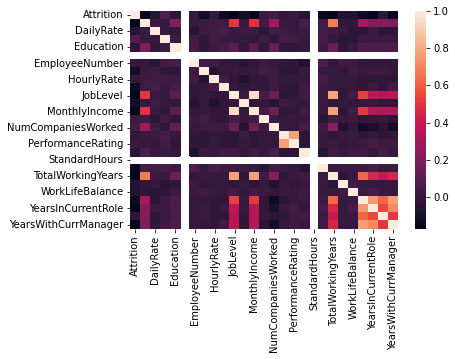

In [105]:
sns.heatmap(A.corr())

# Define X and Y

In [106]:
X = A.drop(["Attrition","EmployeeCount","EmployeeNumber",'Over18', 'StandardHours'], axis=1)
Y = A[['Attrition']]

In [107]:
def Univariate(A, figsize,rows,columns):
    import seaborn as sns
    import matplotlib.pyplot as plt
    x = 1
    plt.figure(figsize=figsize)
    for i in A.columns:
        if A[i].dtypes == 'object':
            plt.subplot(rows,columns,x)
            sns.countplot(A[i])
            x = x + 1
        else:
            plt.subplot(rows,columns,x)
            sns.distplot(A[i])
            x = x+1

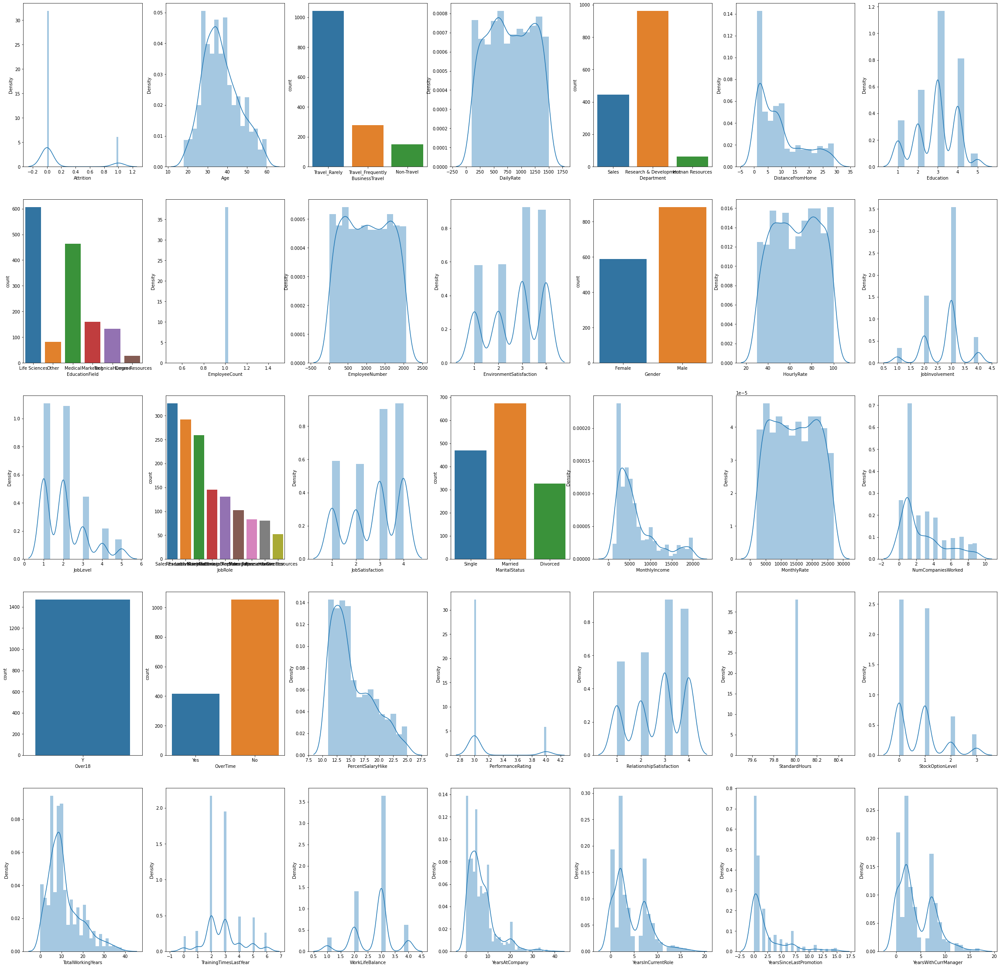

In [108]:
Univariate(A,(40,40), 5,7)

In [109]:
def Bivariate(A, Y,figsize,rows,columns):
    import seaborn as sns
    import matplotlib.pyplot as plt
    x = 1
    plt.figure(figsize=figsize)
    for i in A.columns:
        if A[i].dtypes == 'object':
            plt.subplot(rows,columns,x)
            sns.boxplot(A[i],A[Y])
            x = x + 1
        else:
            plt.subplot(rows,columns,x)
            sns.scatterplot(A[i],A[Y])
            x = x+1

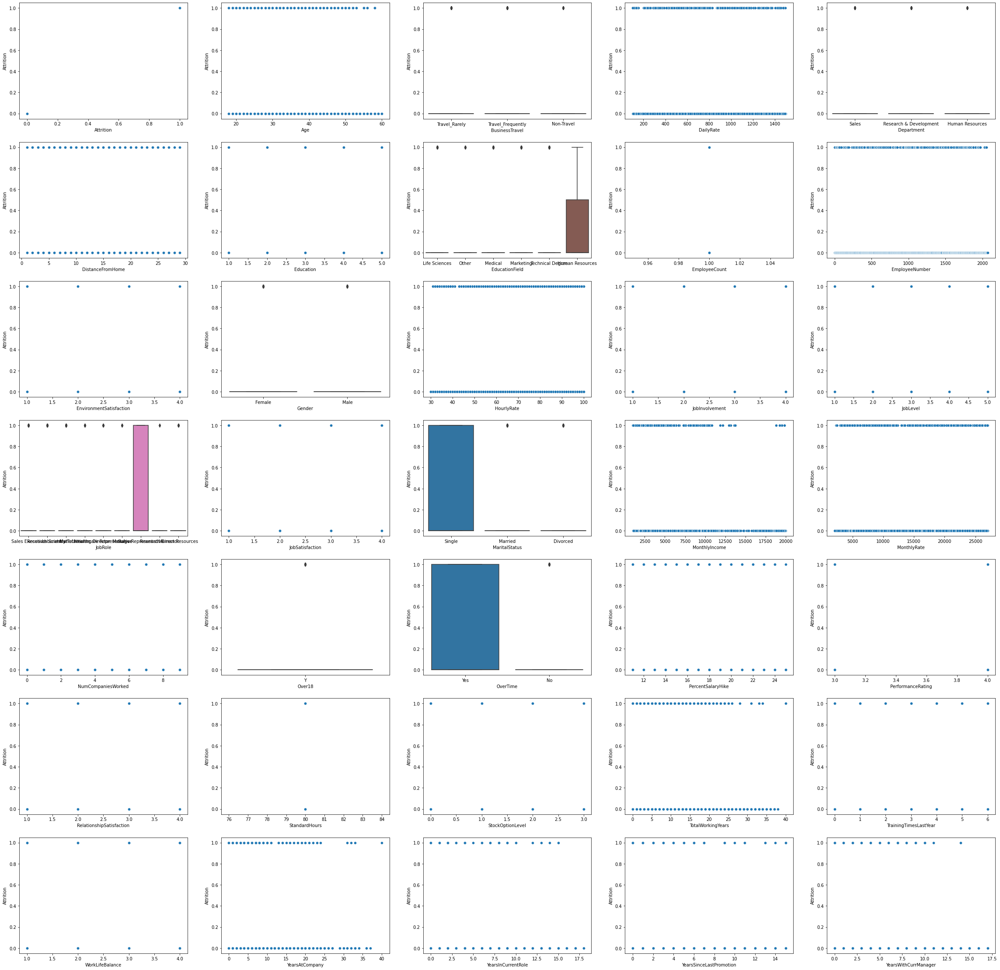

In [110]:
Bivariate(A,'Attrition',(40,40), 7,5)

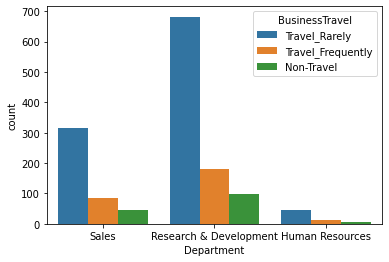

In [111]:
import seaborn as sns
import matplotlib.pyplot as plt
sns.countplot(A["Department"], hue="BusinessTravel", data=A)

# Now Y ----> Attrition

In [112]:
import pandas as pd
B = pd.read_csv("/content/drive/MyDrive/python/Attrition_Project/Trial 01/HR-Employee-Attrition-Table 1.csv")

In [113]:
B.head()

,Attrition,Age,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeNumber,EnvironmentSatisfaction,Gender,HourlyRate,JobInvolvement,JobLevel,JobRole,JobSatisfaction,MaritalStatus,MonthlyIncome,MonthlyRate,NumCompaniesWorked,Over18,OverTime,PercentSalaryHike,PerformanceRating,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,1,41,Travel_Rarely,1102,Sales,1,2,Life Sciences,1,1,2,Female,94,3,2,Sales Executive,4,Single,5993,19479,8,Y,Yes,11,3,1,80,0,8,0,1,6,4,0,5
1,0,49,Travel_Frequently,279,Research & Development,8,1,Life Sciences,1,2,3,Male,61,2,2,Research Scientist,2,Married,5130,24907,1,Y,No,23,4,4,80,1,10,3,3,10,7,1,7
2,1,37,Travel_Rarely,1373,Research & Development,2,2,Other,1,4,4,Male,92,2,1,Laboratory Technician,3,Single,2090,2396,6,Y,Yes,15,3,2,80,0,7,3,3,0,0,0,0
3,0,33,Travel_Frequently,1392,Research & Development,3,4,Life Sciences,1,5,4,Female,56,3,1,Research Scientist,3,Married,2909,23159,1,Y,Yes,11,3,3,80,0,8,3,3,8,7,3,0
4,0,27,Travel_Rarely,591,Research & Development,2,1,Medical,1,7,1,Male,40,3,1,Laboratory Technician,2,Married,3468,16632,9,Y,No,12,3,4,80,1,6,3,3,2,2,2,2


In [114]:
from google.colab import files

In [115]:
!cp /content/drive/MyDrive/python/Attrition_Project/Trial\ 01/PM8.py /content

In [116]:
from PM8 import replacer, preprocessing
replacer(B)

In [117]:

cat = []
con = []
for i in B.columns:
    if B[i].dtypes == 'object':
        cat.append(i)
    else:
        con.append(i)

In [118]:
d = pd.DataFrame([cat, con]).T
d.columns = ["Cate", "Cont"]
d

,Cate,Cont
0,BusinessTravel,Attrition
1,Department,Age
2,EducationField,DailyRate
3,Gender,DistanceFromHome
4,JobRole,Education
5,MaritalStatus,EmployeeCount
6,Over18,EmployeeNumber
7,OverTime,EnvironmentSatisfaction
8,None,HourlyRate
9,None,JobInvolvement


In [119]:
pd.crosstab(B.Department, B.Gender)

Gender,Female,Male
Department,,
Human Resources,20,43
Research & Development,379,582
Sales,189,257


In [120]:
B[cat][:-7]

,BusinessTravel,Department,EducationField,Gender,JobRole,MaritalStatus,Over18,OverTime
0,Travel_Rarely,Sales,Life Sciences,Female,Sales Executive,Single,Y,Yes
1,Travel_Frequently,Research & Development,Life Sciences,Male,Research Scientist,Married,Y,No
2,Travel_Rarely,Research & Development,Other,Male,Laboratory Technician,Single,Y,Yes
3,Travel_Frequently,Research & Development,Life Sciences,Female,Research Scientist,Married,Y,Yes
4,Travel_Rarely,Research & Development,Medical,Male,Laboratory Technician,Married,Y,No
5,Travel_Frequently,Research & Development,Life Sciences,Male,Laboratory Technician,Single,Y,No
6,Travel_Rarely,Research & Development,Medical,Female,Laboratory Technician,Married,Y,Yes
7,Travel_Rarely,Research & Development,Life Sciences,Male,Laboratory Technician,Divorced,Y,No
8,Travel_Frequently,Research & Development,Life Sciences,Male,Manufacturing Director,Single,Y,No
9,Travel_Rarely,Research & Development,Medical,Male,Healthcare Representative,Married,Y,No


In [121]:
for i in B[cat]:
    for j in B[cat]:
        a = pd.crosstab(B[i], B[j])
        print(a)
        print("===================||===================||===================||===================")

BusinessTravel     Non-Travel  Travel_Frequently  Travel_Rarely
BusinessTravel                                                 
Non-Travel                150                  0              0
Travel_Frequently           0                277              0
Travel_Rarely               0                  0           1043
===================||===================||===================||===================
Department         Human Resources  Research & Development  Sales
BusinessTravel                                                   
Non-Travel                       6                      97     47
Travel_Frequently               11                     182     84
Travel_Rarely                   46                     682    315
===================||===================||===================||===================
EducationField     Human Resources  Life Sciences  Marketing  Medical  Other  \
BusinessTravel                                                                 
Non-Travel              

In [122]:
B.columns

Index(['Attrition', 'Age', 'BusinessTravel', 'DailyRate', 'Department',
       'DistanceFromHome', 'Education', 'EducationField', 'EmployeeCount',
       'EmployeeNumber', 'EnvironmentSatisfaction', 'Gender', 'HourlyRate',
       'JobInvolvement', 'JobLevel', 'JobRole', 'JobSatisfaction',
       'MaritalStatus', 'MonthlyIncome', 'MonthlyRate', 'NumCompaniesWorked',
       'Over18', 'OverTime', 'PercentSalaryHike', 'PerformanceRating',
       'RelationshipSatisfaction', 'StandardHours', 'StockOptionLevel',
       'TotalWorkingYears', 'TrainingTimesLastYear', 'WorkLifeBalance',
       'YearsAtCompany', 'YearsInCurrentRole', 'YearsSinceLastPromotion',
       'YearsWithCurrManager'],
      dtype='object')

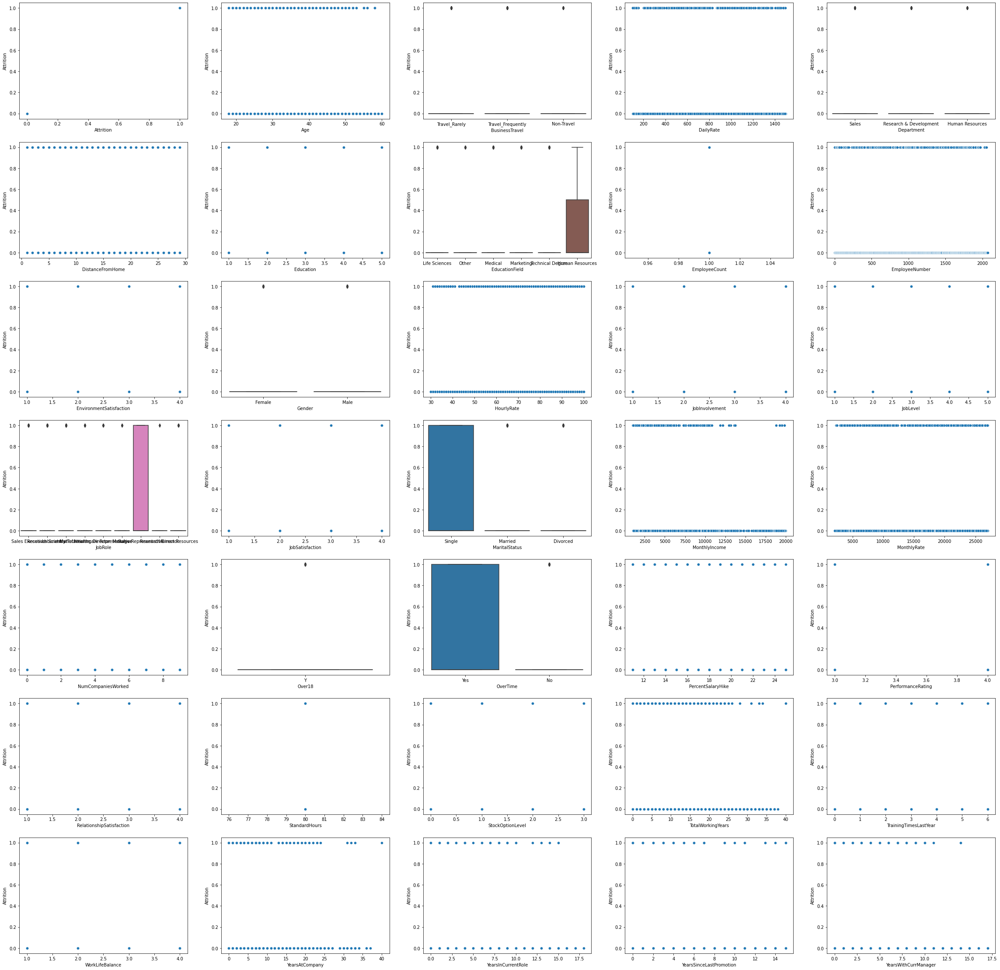

In [123]:
from warnings import filterwarnings
filterwarnings("ignore")
Bivariate(B, "Attrition", (40, 40), 7,5)

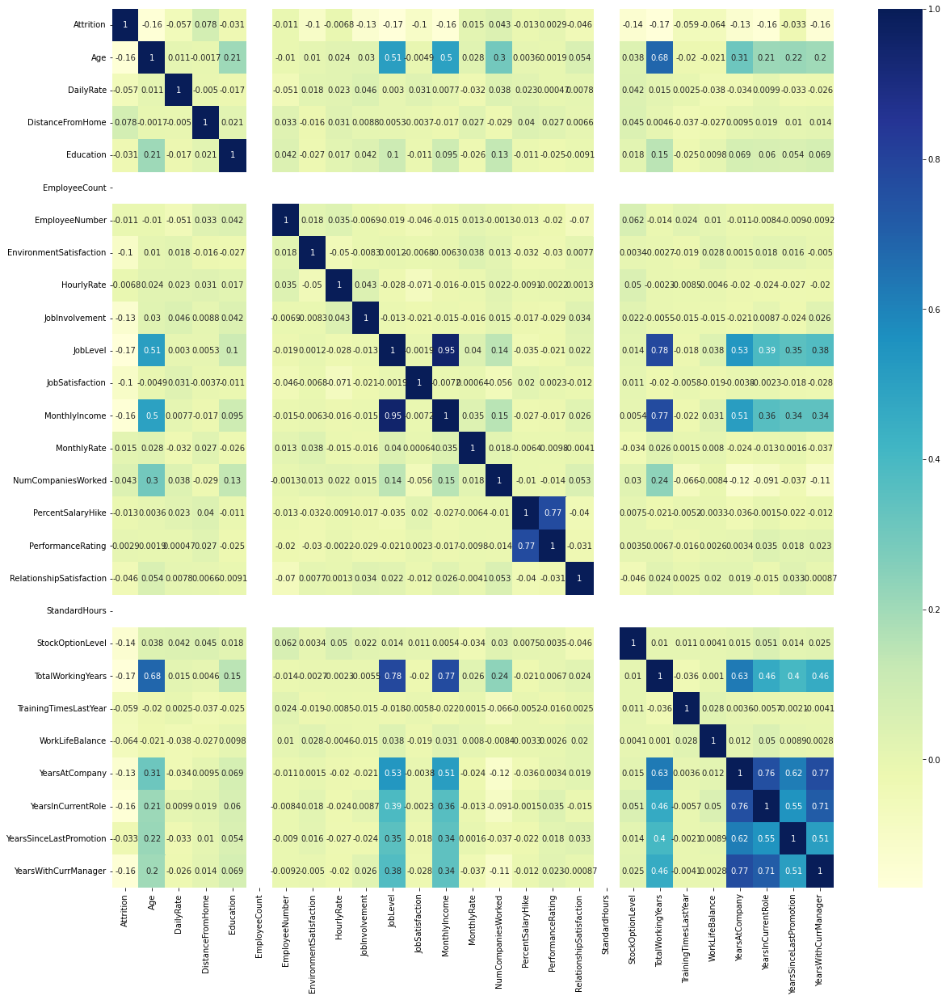

In [124]:
plt.figure(figsize=(20,20))

sns.heatmap(A.corr(), annot = True, cmap="YlGnBu")

In [125]:
X = B.drop(['Over18', "Attrition", "StandardHours",'EmployeeCount','EmployeeNumber'], axis = 1)
Y = B[["Attrition"]]

In [126]:
X = preprocessing(X)

In [127]:
from sklearn.model_selection import train_test_split
xtrain, xtest,ytrain, ytest = train_test_split(X, Y,test_size=0.2, random_state=40)

# Adaboost 

In [128]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import AdaBoostClassifier
dtr = DecisionTreeClassifier(random_state=20,max_depth=2)
abr = AdaBoostClassifier(dtr)
tp = {"n_estimators": range(40)}
from sklearn.model_selection import GridSearchCV
cv = GridSearchCV(abr,tp, scoring="accuracy", cv = 5)
cvmodel = cv.fit(xtrain,ytrain)
bestval =cvmodel.best_params_
bestval

{'n_estimators': 17}

In [129]:
dtr = DecisionTreeClassifier(random_state=20,max_depth=2)
abr = AdaBoostClassifier(dtr, random_state=20, n_estimators=bestval['n_estimators'])
modelr = abr.fit(xtrain,ytrain)
predtr = modelr.predict(xtrain)
predts = modelr.predict(xtest)
from sklearn.metrics import accuracy_score
print("train Acc ====>", round(accuracy_score(predtr, ytrain),20))
print("test Acc ====>", round(accuracy_score(predts, ytest),20))

train Acc ====> 0.9090136054421769
test Acc ====> 0.8639455782312924


# Dtree

In [130]:
from sklearn.tree import DecisionTreeClassifier
dtr = DecisionTreeClassifier(random_state=20)
tp = {"max_depth": range(20)}
from sklearn.model_selection import GridSearchCV
cv = GridSearchCV(dtr,tp, scoring="accuracy", cv = 5)
cvmodel = cv.fit(xtrain,ytrain)
bestval =cvmodel.best_params_
bestval

{'max_depth': 5}

In [131]:
dtr = DecisionTreeClassifier(random_state=20,max_depth=bestval["max_depth"])
model = dtr.fit(xtrain,ytrain)
predtr = model.predict(xtrain)
predts = model.predict(xtest)
from sklearn.metrics import accuracy_score
print("train Acc ====>", round(accuracy_score(predtr, ytrain),20))
print("test Acc ====>", round(accuracy_score(predts, ytest),20))

train Acc ====> 0.8937074829931972
test Acc ====> 0.8231292517006803


# RfC

In [132]:
from sklearn.ensemble import RandomForestClassifier
rfc = RandomForestClassifier()
tp = {"n_estimators": range(40)}
from sklearn.model_selection import GridSearchCV
cv = GridSearchCV(rfc,tp, scoring="accuracy", cv = 5)
cvmodel = cv.fit(xtrain,ytrain)
bestval =cvmodel.best_params_
bestval

{'n_estimators': 28}

In [133]:
rfc  = RandomForestClassifier(random_state=20,n_estimators=bestval['n_estimators'])
modelr = rfc.fit(xtrain,ytrain)
predtr = modelr.predict(xtrain)
predts = modelr.predict(xtest)
from sklearn.metrics import accuracy_score
print("train Acc ====>", round(accuracy_score(predtr, ytrain),20))
print("test Acc ====>", round(accuracy_score(predts, ytest),20))

train Acc ====> 0.9974489795918368
test Acc ====> 0.8707482993197279


# **Artificial Neural Network**

In [ ]:
from keras.layers import Dense, Dropout
from keras.models import Sequential 
!pip install keras_tuner

     |████████████████████████████████| 98 kB 3.8 MB/s 



# **Keras Tuner**

In [134]:
import keras_tuner as kt

In [136]:
def model_builder(hp):
    nn = Sequential()
    nn.add(Dense(1500,input_dim=xtrain.shape[1]))
    x = hp.Int("units",min_value=20,max_value=1600,step=35)
    nn.add(Dense(units=x))
    y = hp.Choice("rate",values=[0.1,0.2,0.3,0.4,0.5,0.6,0.7])
    nn.add(Dropout(rate=y))
    nn.add(Dense(1,activation="sigmoid"))
    nn.compile(loss="binary_crossentropy",metrics="accuracy")
    return nn


In [137]:
import keras_tuner as kt
tuner = kt.Hyperband(model_builder,
            objective="val_accuracy",
            max_epochs=10,
            directory="/content/drive/MyDrive/python/Attrition_Project/AtriionNN4",
            project_name="Keras_TN")


In [138]:

tuner.search(xtrain,ytrain,epochs=500, validation_split=0.2)

Trial 30 Complete [00h 00m 04s]
val_accuracy: 0.8601694703102112

Best val_accuracy So Far: 0.8728813529014587
Total elapsed time: 00h 02m 22s
INFO:tensorflow:Oracle triggered exit


# **Dense Layers**

In [139]:

tuner.get_best_hyperparameters()[0].get("units")

195

# **Dropout Layers**

In [140]:
tuner.get_best_hyperparameters()[0].get("rate")

0.1

In [146]:
from keras.callbacks import EarlyStopping

es = EarlyStopping(patience=25, monitor="val_accuracy")
nn = Sequential()
# nn.add(Dense(650,input_dim=xtrain.shape[1]))
# nn.add(Dense(650, activation="relu"))
# nn.add(Dropout(0.4))
# nn.add(Dense(650, activation="relu"))
# nn.add(Dropout(0.4))
# nn.add(Dense(650, activation="relu"))
# nn.add(Dropout(0.4))
# nn.add(Dense(650, activation="relu"))
nn.add(Dense(195,input_dim=xtrain.shape[1]))
nn.add(Dense(195, activation="relu"))
nn.add(Dropout(0.1))
nn.add(Dense(195, activation="relu"))
nn.add(Dropout(0.1))
nn.add(Dense(195, activation="relu"))
nn.add(Dropout(0.1))
nn.add(Dense(195, activation="relu"))
nn.add(Dense(1,activation="sigmoid"))
nn.compile(optimizer="Adam", loss="binary_crossentropy",metrics="accuracy")

In [147]:

model = nn.fit(xtrain,ytrain,epochs = 100, batch_size=50, validation_split = 0.2)


Epoch 1/100
19/19 [==============================] - 2s 46ms/step - loss: 0.4338 - accuracy: 0.8394 - val_loss: 0.4337 - val_accuracy: 0.8136
Epoch 2/100
19/19 [==============================] - 0s 15ms/step - loss: 0.3304 - accuracy: 0.8511 - val_loss: 0.4253 - val_accuracy: 0.8644
Epoch 3/100
19/19 [==============================] - 0s 15ms/step - loss: 0.2987 - accuracy: 0.8862 - val_loss: 0.4642 - val_accuracy: 0.8559
Epoch 4/100
19/19 [==============================] - 0s 13ms/step - loss: 0.2339 - accuracy: 0.9074 - val_loss: 0.4894 - val_accuracy: 0.8644
Epoch 5/100
19/19 [==============================] - 0s 11ms/step - loss: 0.1976 - accuracy: 0.9277 - val_loss: 0.6329 - val_accuracy: 0.8305
Epoch 6/100
19/19 [==============================] - 0s 15ms/step - loss: 0.1614 - accuracy: 0.9415 - val_loss: 0.6817 - val_accuracy: 0.8390
Epoch 7/100
19/19 [==============================] - 0s 13ms/step - loss: 0.1371 - accuracy: 0.9489 - val_loss: 0.7506 - val_accuracy: 0.8517
Epoch 

In [148]:
Prediction = (nn.predict(xtest)>0.5).astype("int32")

In [149]:
Prediction

array([[0],
       [0],
       [0],
       [1],
       [0],
       [0],
       [0],
       [0],
       [0],
       [0],
       [0],
       [1],
       [0],
       [1],
       [1],
       [0],
       [0],
       [1],
       [0],
       [0],
       [1],
       [0],
       [0],
       [0],
       [0],
       [0],
       [1],
       [0],
       [0],
       [0],
       [0],
       [0],
       [0],
       [0],
       [1],
       [1],
       [1],
       [0],
       [0],
       [0],
       [0],
       [0],
       [0],
       [0],
       [0],
       [0],
       [0],
       [0],
       [0],
       [0],
       [0],
       [0],
       [1],
       [0],
       [0],
       [0],
       [0],
       [0],
       [0],
       [0],
       [0],
       [0],
       [0],
       [0],
       [0],
       [0],
       [0],
       [0],
       [0],
       [0],
       [0],
       [0],
       [0],
       [0],
       [0],
       [1],
       [0],
       [0],
       [1],
       [0],
       [1],
       [0],
       [0],
    

In [150]:
from sklearn.metrics import accuracy_score
Predictiontr = (nn.predict(xtrain)>0.5).astype("int32")
print(accuracy_score(ytest,Prediction ))
print(accuracy_score(ytrain,Predictiontr ))


0.8605442176870748
0.9693877551020408


# **xgboost Alog**

In [ ]:
from xgboost import XGBClassifier
xbc = XGBClassifier(n_estimators=2000, learning_rate=0.01, random_state=400)
modelr = xbc.fit(xtrain,ytrain)
predtr = modelr.predict(xtrain)
predts = modelr.predict(xtest)
from sklearn.metrics import accuracy_score
print("train Acc ====>", round(accuracy_score(predtr, ytrain),20))
print("test Acc ====>", round(accuracy_score(predts, ytest),20))

train Acc ====> 0.9778911564625851
test Acc ====> 0.8605442176870748


# **Naive Bayes Alog**

In [151]:
from sklearn.naive_bayes import GaussianNB
gnb = GaussianNB()
modelr = gnb.fit(xtrain,ytrain)
predtr = modelr.predict(xtrain)
predts = modelr.predict(xtest)
from sklearn.metrics import accuracy_score
print("train Acc ====>", round(accuracy_score(predtr, ytrain),20))
print("test Acc ====>", round(accuracy_score(predts, ytest),20))

train Acc ====> 0.6879251700680272
test Acc ====> 0.6836734693877551


# **Logistic Regression**

In [152]:
from sklearn.linear_model import LogisticRegression
lgr = LogisticRegression()
modelr = lgr.fit(xtrain,ytrain)
predtr = modelr.predict(xtrain)
predts = modelr.predict(xtest)
from sklearn.metrics import accuracy_score
print("train Acc ====>", round(accuracy_score(predtr, ytrain),20))
print("test Acc ====>", round(accuracy_score(predts, ytest),20))

train Acc ====> 0.8920068027210885
test Acc ====> 0.8979591836734694


# **Clustering**

In [153]:
B.columns

Index(['Attrition', 'Age', 'BusinessTravel', 'DailyRate', 'Department',
       'DistanceFromHome', 'Education', 'EducationField', 'EmployeeCount',
       'EmployeeNumber', 'EnvironmentSatisfaction', 'Gender', 'HourlyRate',
       'JobInvolvement', 'JobLevel', 'JobRole', 'JobSatisfaction',
       'MaritalStatus', 'MonthlyIncome', 'MonthlyRate', 'NumCompaniesWorked',
       'Over18', 'OverTime', 'PercentSalaryHike', 'PerformanceRating',
       'RelationshipSatisfaction', 'StandardHours', 'StockOptionLevel',
       'TotalWorkingYears', 'TrainingTimesLastYear', 'WorkLifeBalance',
       'YearsAtCompany', 'YearsInCurrentRole', 'YearsSinceLastPromotion',
       'YearsWithCurrManager'],
      dtype='object')

In [154]:
C = X[["MonthlyIncome", "HourlyRate"]]
C

,MonthlyIncome,HourlyRate
0,-0.108350,1.383138
1,-0.291719,-0.240677
2,-0.937654,1.284725
3,-0.763634,-0.486709
4,-0.644858,-1.274014
5,-0.729850,0.645041
6,-0.814416,0.743454
7,-0.809529,0.054562
8,0.642338,-1.077188
9,-0.268983,1.383138


In [155]:
from sklearn.cluster import KMeans
k = list(range(1,15))
wcss = []
for i in range(1,15):
  km = KMeans(n_clusters=i)
  model = km.fit(C)
  wcss.append(model.inertia_)

([<matplotlib.axis.XTick at 0x7f1d881fecd0>,
 <a list of 14 Text major ticklabel objects>)

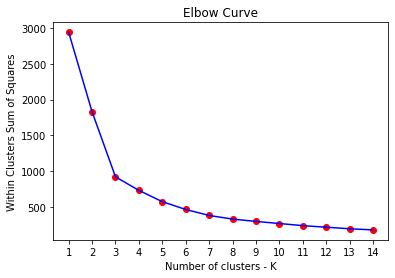

In [156]:
import matplotlib.pyplot as plt
plt.scatter(k,wcss,c="red")
plt.plot(k,wcss,c="blue")
plt.xlabel("Number of clusters - K")
plt.ylabel("Within Clusters Sum of Squares")
plt.title("Elbow Curve")
plt.xticks(range(1,15,1))

In [157]:
km = KMeans(n_clusters=4)
model = km.fit(C)

In [158]:
B1 = B

In [159]:
B1['clusters'] = model.labels_

In [160]:
B.columns

Index(['Attrition', 'Age', 'BusinessTravel', 'DailyRate', 'Department',
       'DistanceFromHome', 'Education', 'EducationField', 'EmployeeCount',
       'EmployeeNumber', 'EnvironmentSatisfaction', 'Gender', 'HourlyRate',
       'JobInvolvement', 'JobLevel', 'JobRole', 'JobSatisfaction',
       'MaritalStatus', 'MonthlyIncome', 'MonthlyRate', 'NumCompaniesWorked',
       'Over18', 'OverTime', 'PercentSalaryHike', 'PerformanceRating',
       'RelationshipSatisfaction', 'StandardHours', 'StockOptionLevel',
       'TotalWorkingYears', 'TrainingTimesLastYear', 'WorkLifeBalance',
       'YearsAtCompany', 'YearsInCurrentRole', 'YearsSinceLastPromotion',
       'YearsWithCurrManager', 'clusters'],
      dtype='object')

In [161]:
B1[B1.clusters == 2][["JobLevel"]]

,JobLevel
0,2
2,1
5,1
6,1
7,1
9,2
10,1
13,1
16,1
17,1


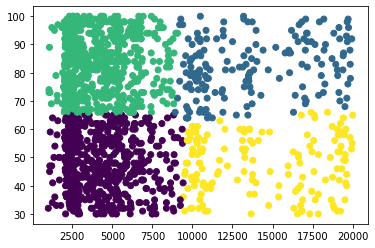

In [162]:
plt.scatter(B1.MonthlyIncome,B1.HourlyRate,c=B1.clusters)
plt.show()

# **Hierarichal Clustering**



In [184]:
import pandas as pd
A1 = pd.read_csv("/content/drive/MyDrive/python/Attrition_Project/Trial 01/HR-Employee-Attrition-Table 1.csv")
A1


,Attrition,Age,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeNumber,EnvironmentSatisfaction,Gender,HourlyRate,JobInvolvement,JobLevel,JobRole,JobSatisfaction,MaritalStatus,MonthlyIncome,MonthlyRate,NumCompaniesWorked,Over18,OverTime,PercentSalaryHike,PerformanceRating,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,1,41,Travel_Rarely,1102,Sales,1,2,Life Sciences,1,1,2,Female,94,3,2,Sales Executive,4,Single,5993,19479,8,Y,Yes,11,3,1,80,0,8,0,1,6,4,0,5
1,0,49,Travel_Frequently,279,Research & Development,8,1,Life Sciences,1,2,3,Male,61,2,2,Research Scientist,2,Married,5130,24907,1,Y,No,23,4,4,80,1,10,3,3,10,7,1,7
2,1,37,Travel_Rarely,1373,Research & Development,2,2,Other,1,4,4,Male,92,2,1,Laboratory Technician,3,Single,2090,2396,6,Y,Yes,15,3,2,80,0,7,3,3,0,0,0,0
3,0,33,Travel_Frequently,1392,Research & Development,3,4,Life Sciences,1,5,4,Female,56,3,1,Research Scientist,3,Married,2909,23159,1,Y,Yes,11,3,3,80,0,8,3,3,8,7,3,0
4,0,27,Travel_Rarely,591,Research & Development,2,1,Medical,1,7,1,Male,40,3,1,Laboratory Technician,2,Married,3468,16632,9,Y,No,12,3,4,80,1,6,3,3,2,2,2,2
5,0,32,Travel_Frequently,1005,Research & Development,2,2,Life Sciences,1,8,4,Male,79,3,1,Laboratory Technician,4,Single,3068,11864,0,Y,No,13,3,3,80,0,8,2,2,7,7,3,6
6,0,59,Travel_Rarely,1324,Research & Development,3,3,Medical,1,10,3,Female,81,4,1,Laboratory Technician,1,Married,2670,9964,4,Y,Yes,20,4,1,80,3,12,3,2,1,0,0,0
7,0,30,Travel_Rarely,1358,Research & Development,24,1,Life Sciences,1,11,4,Male,67,3,1,Laboratory Technician,3,Divorced,2693,13335,1,Y,No,22,4,2,80,1,1,2,3,1,0,0,0
8,0,38,Travel_Frequently,216,Research & Development,23,3,Life Sciences,1,12,4,Male,44,2,3,Manufacturing Director,3,Single,9526,8787,0,Y,No,21,4,2,80,0,10,2,3,9,7,1,8
9,0,36,Travel_Rarely,1299,Research & Development,27,3,Medical,1,13,3,Male,94,3,2,Healthcare Representative,3,Married,5237,16577,6,Y,No,13,3,2,80,2,17,3,2,7,7,7,7


In [185]:
A = preprocessing(A1)

In [191]:
A1.columns

Index(['Attrition', 'Age', 'BusinessTravel', 'DailyRate', 'Department',
       'DistanceFromHome', 'Education', 'EducationField', 'EmployeeCount',
       'EmployeeNumber', 'EnvironmentSatisfaction', 'Gender', 'HourlyRate',
       'JobInvolvement', 'JobLevel', 'JobRole', 'JobSatisfaction',
       'MaritalStatus', 'MonthlyIncome', 'MonthlyRate', 'NumCompaniesWorked',
       'Over18', 'OverTime', 'PercentSalaryHike', 'PerformanceRating',
       'RelationshipSatisfaction', 'StandardHours', 'StockOptionLevel',
       'TotalWorkingYears', 'TrainingTimesLastYear', 'WorkLifeBalance',
       'YearsAtCompany', 'YearsInCurrentRole', 'YearsSinceLastPromotion',
       'YearsWithCurrManager'],
      dtype='object')

In [197]:
from sklearn.cluster import AgglomerativeClustering
agc = AgglomerativeClustering(n_clusters=5)
B = A1[['PercentSalaryHike' , 'MonthlyIncome', "JobSatisfaction", "DistanceFromHome"]]
model = agc.fit(B)

In [198]:
B["Cluster"]=model.labels_

In [194]:
from scipy.spatial import distance_matrix
from scipy.cluster.hierarchy import dendrogram, linkage
import matplotlib.pyplot as plt

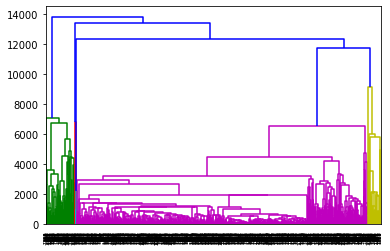

In [195]:
D = pd.DataFrame(distance_matrix(B.values, B.values))
dendrogram(linkage(D))
plt.show()

In [196]:

A1[A1.Cluster == 1][['EnvironmentSatisfaction']]

,PercentSalaryHike
0,11
1,23
2,15
3,11
4,12
5,13
6,20
7,22
9,13
10,13


In [201]:
B["EnvironmentSatisfaction"]=A1.EnvironmentSatisfaction

In [202]:
B.head()

,PercentSalaryHike,MonthlyIncome,JobSatisfaction,DistanceFromHome,Cluster,EnvironmentSatisfaction
0,11,5993,4,1,1,2
1,23,5130,2,8,1,3
2,15,2090,3,2,3,4
3,11,2909,3,3,3,4
4,12,3468,2,2,3,1


In [203]:

B["BusinessTravel"]=A1.BusinessTravel

In [204]:
B.head()

,PercentSalaryHike,MonthlyIncome,JobSatisfaction,DistanceFromHome,Cluster,EnvironmentSatisfaction,BusinessTravel
0,11,5993,4,1,1,2,Travel_Rarely
1,23,5130,2,8,1,3,Travel_Frequently
2,15,2090,3,2,3,4,Travel_Rarely
3,11,2909,3,3,3,4,Travel_Frequently
4,12,3468,2,2,3,1,Travel_Rarely


In [205]:
B[B.Cluster == 2][['BusinessTravel']]

,BusinessTravel
18,Travel_Rarely
25,Travel_Rarely
29,Travel_Rarely
45,Travel_Rarely
62,Travel_Rarely
65,Travel_Rarely
105,Non-Travel
106,Travel_Frequently
112,Non-Travel
119,Travel_Frequently
